## CNN Structure

A classification CNN takes in an input image and outputs a distribution of class scores, from which we can find the most likely class for a given image.

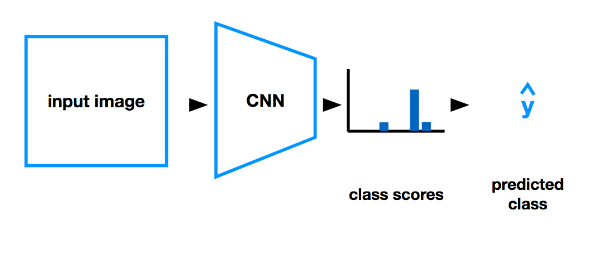

## CNN Layers

The CNN itself is comprised of a number of layers; layers that extract features from input images, reduce the dimensionality of the input, and eventually produce class scores. In this lesson, we'll go over all of these different layers, so that you know how to define and train a complete CNN!

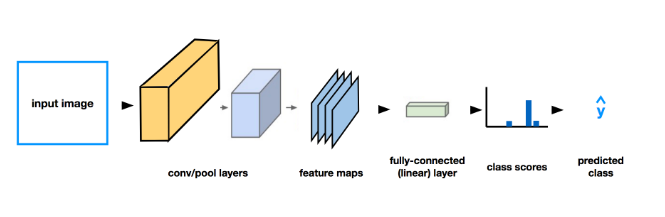

## Neural Network Architecture

A neural network architecture is a computational model inspired by the human brain, used in machine learning and deep learning.It consists of layers of interconnected artificial neurons that process and learn from data. Here are some key components:

* **Input Layer:** Receives the initial data or features.

* **Hidden Layers:** Layers in between the input and output layers that perform computations and learn patterns.

* **Output Layer:** Produces the network's final predictions or classifications.

* **Neurons (or Nodes):** Basic computational units that process and transmit information.

* **Weights and Biases:** Parameters that adjust during training to make accurate predictions.

* **Activation Functions:** Functions that introduce non-linearity into the model, enabling it to learn complex patterns.

* **Forward Propagation:** The process of passing data through the network to make predictions.

* **Backpropagation:** The process of updating weights and biases based on prediction errors to improve the network's performance.

Neural networks can come in various architectures, such as feedforward, convolutional, recurrent, and more, depending on the specific task and data they are designed for.

### Combining Models

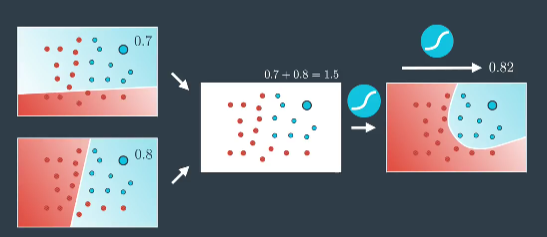

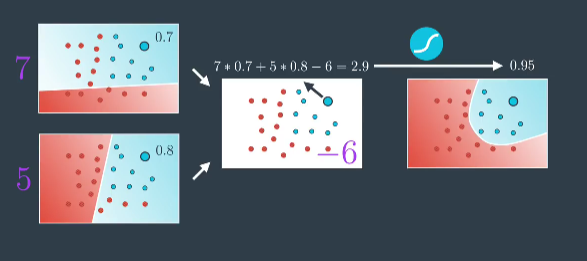

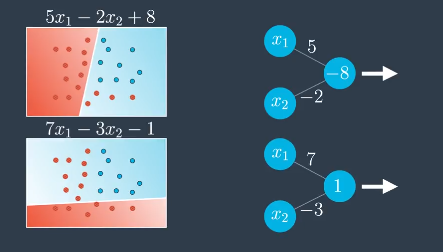

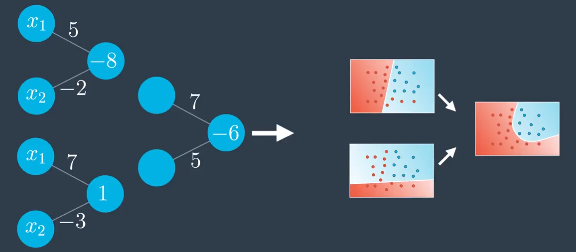

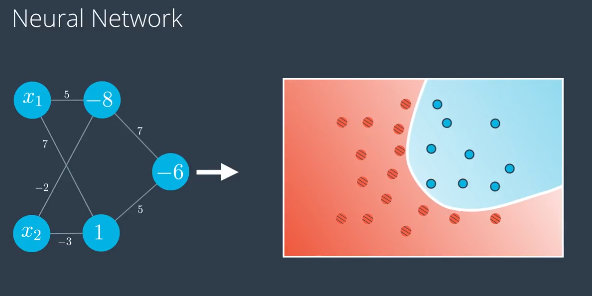

### Multiple layers

"Multiple layers" in the context of neural networks refers to having more than one layer of artificial neurons between the input and output layers. These intermediate layers are called hidden layers. Having multiple layers allows neural networks to learn complex patterns and relationships in data, making them suitable for various tasks, such as image recognition, natural language processing, and more.

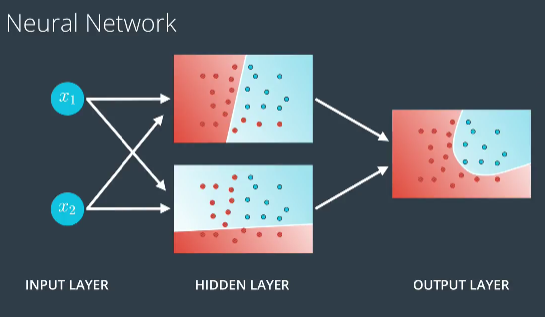

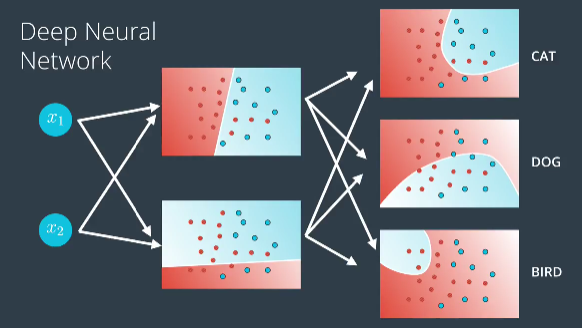

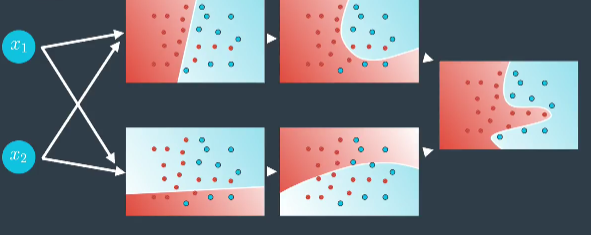

### Multi-Class Classification

Multi-class classification is a machine learning task where the goal is to categorize data points into one of multiple possible classes or categories. Unlike binary classification, where there are only two possible outcomes, multi-class classification deals with more than two classes.

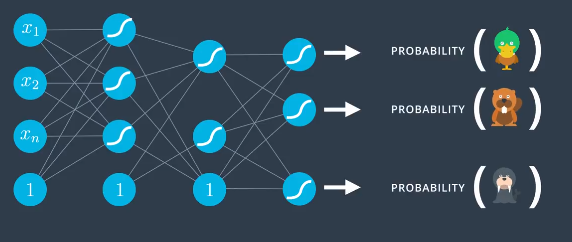

### Feedforward

A feedforward neural network, in short, is a type of artificial neural network where information flows in one direction, from the input layer through one or more hidden layers to the output layer, without any feedback loops. It's the most straightforward neural network architecture and is commonly used for various machine learning tasks, including pattern recognition and regression. Feedforward networks are also known as multilayer perceptrons (MLPs).

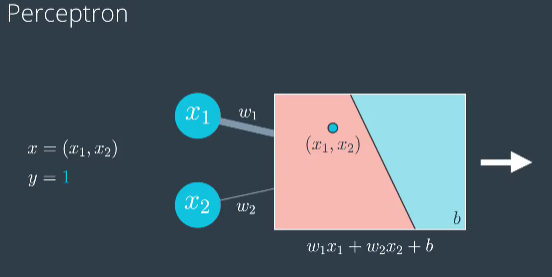

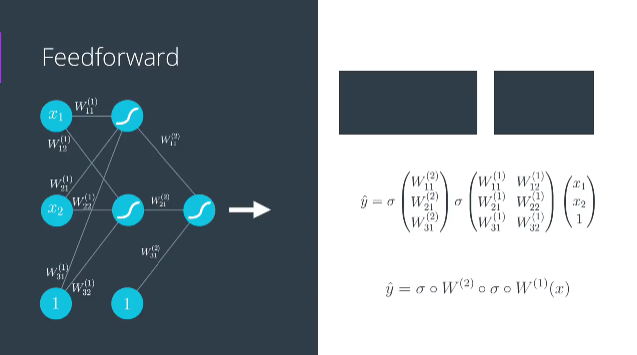

### Error Function


An error function, often referred to as a loss function or cost function in machine learning, is a mathematical measure that quantifies the difference between the predicted values of a model and the actual observed values in the training data. The goal of an error function is to provide a way to optimize a model's parameters during training so that it can make more accurate predictions. The model adjusts its parameters to minimize this error function, aiming to make its predictions as close as possible to the actual values. Common error functions include mean squared error (MSE), cross-entropy, and others, depending on the type of problem and the nature of the data.

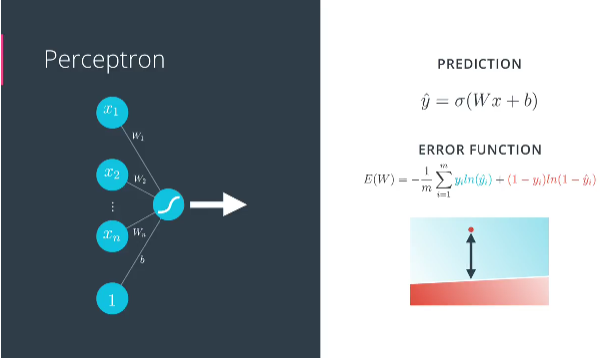

## Backpropagation

Backpropagation, short for "backward propagation of errors," is a key algorithm used to train neural networks in machine learning. In short:

* **Forward Pass:** The neural network processes input data, layer by layer, to make predictions.

* **Calculate Error:** The difference between the predicted output and the actual target (the error) is computed.

* **Backward Pass:** Backpropagation then works backward through the network to calculate how much each neuron's contribution to the error, using the chain rule from calculus.

* **Update Weights:** The network adjusts its internal parameters (weights and biases) to reduce the error by a small amount. This is typically done using optimization algorithms like gradient descent.

* **Repeat:** Steps 1 to 4 are repeated for multiple iterations or epochs to minimize the error, allowing the neural network to learn from the data.

By iteratively adjusting the weights based on errors, backpropagation enables neural networks to learn and improve their performance on a wide range of tasks.

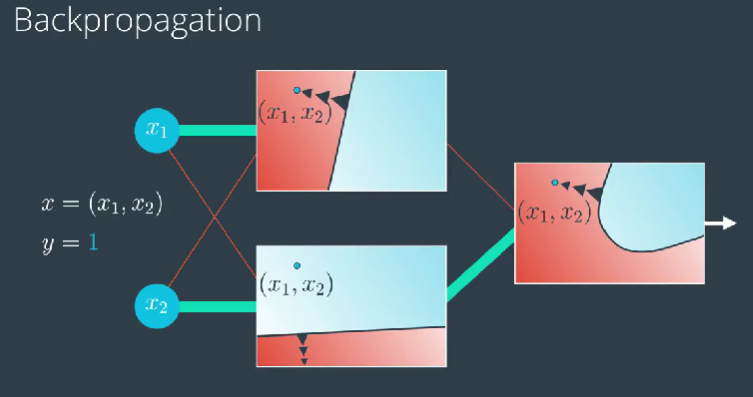

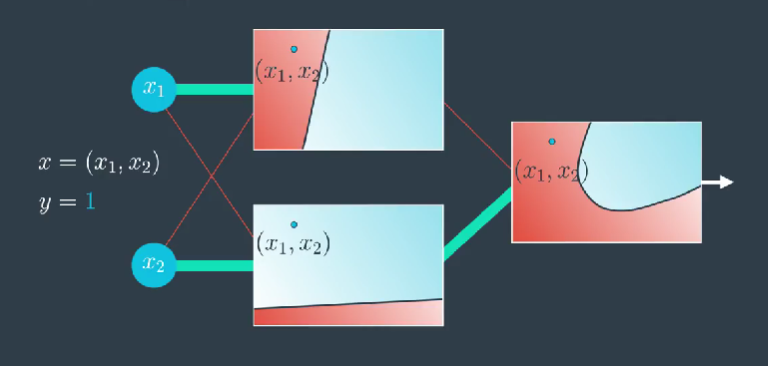

### Calculating The Gradient

Backpropagation is a critical algorithm for training artificial neural networks. In short, it's a process that adjusts the model's parameters (weights and biases) to minimize the prediction error. Here's the math for backpropagation in a nutshell:

* **Forward Pass:**

  * Compute the predicted output using the current model parameters.
  * Calculate the error between the predicted output and the actual target.
  
* **Backward Pass (Backpropagation):**

  * Compute the gradient of the error with respect to the model's output.
  * Propagate this gradient backward through the layers of the network, calculating the gradient of the error with respect to the model's parameters in each layer.

* **Update Parameters:**

  * Adjust the model's parameters (weights and biases) using the calculated gradients. This is typically done using gradient descent or one of its variants.
  * The update rule for each parameter is:
  $$ new__parameter = old__parameter - learning__rate * gradient $$
  
Here, the learning rate is a hyperparameter that controls the size of the parameter updates.

* **Repeat:**

  * Iterate through the dataset multiple times (epochs) or until a convergence criterion is met.
  * Continue adjusting the parameters in each iteration to minimize the error.
  
This iterative process of forward pass, backward pass, and parameter update is how a neural network learns from data. The goal is to minimize the prediction error over time by updating the model's parameters in the direction that reduces the error.

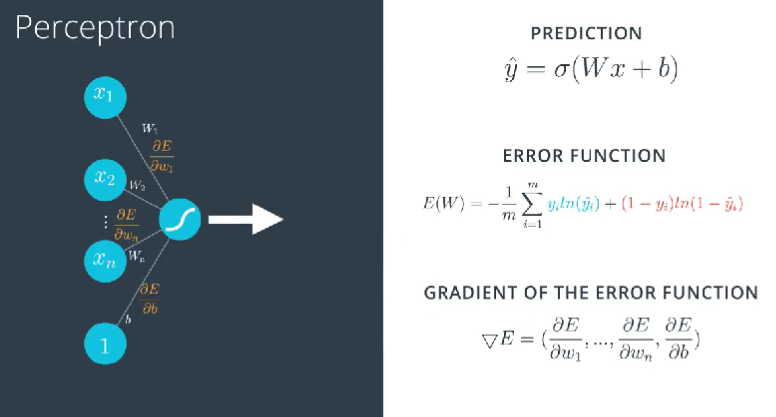

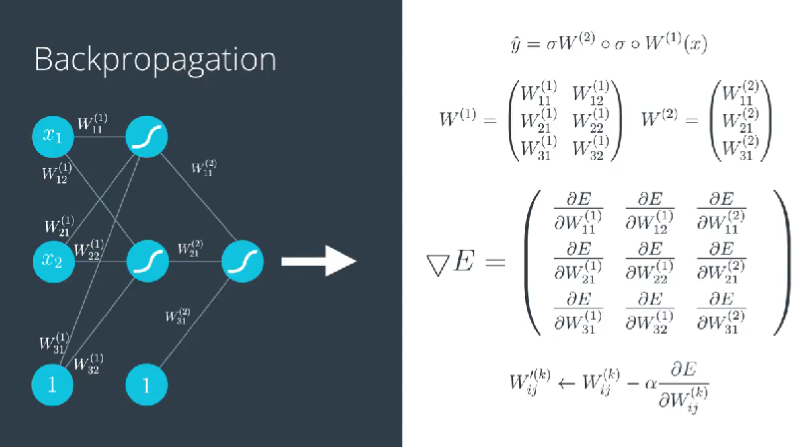

Alpha is learning rate

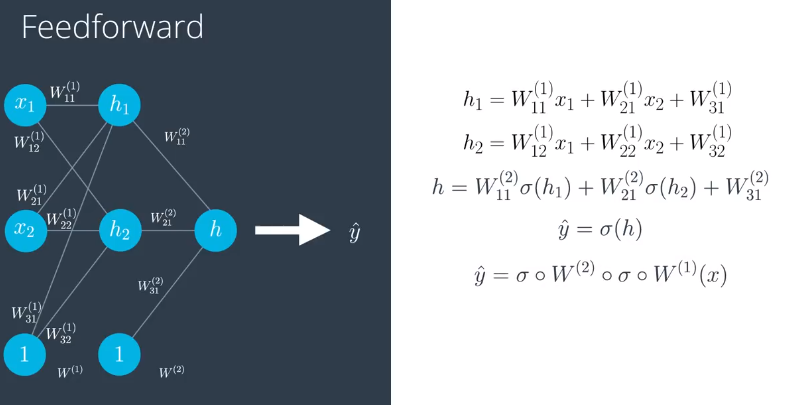

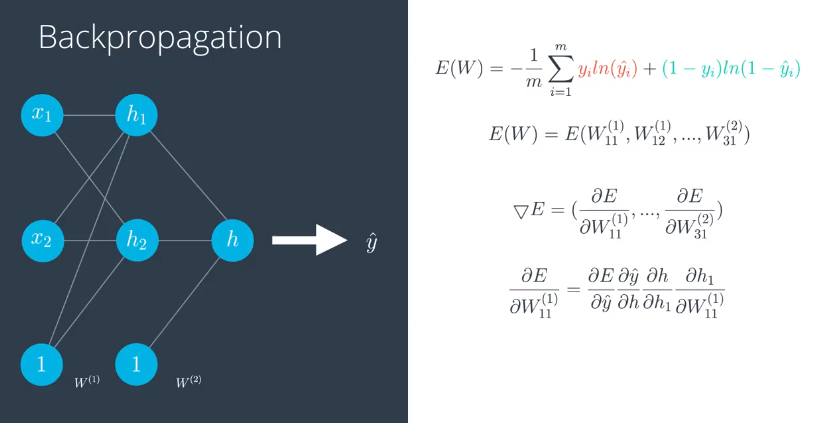

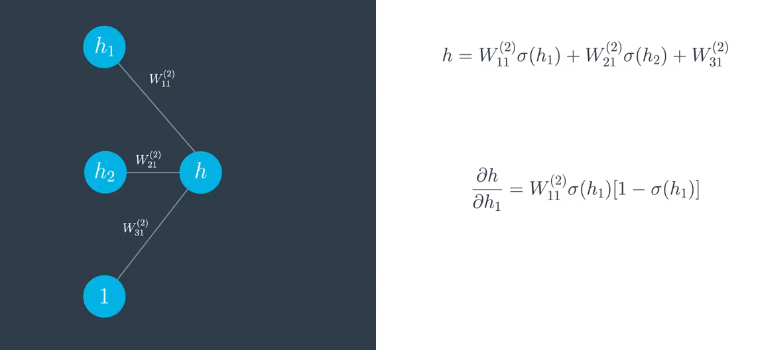

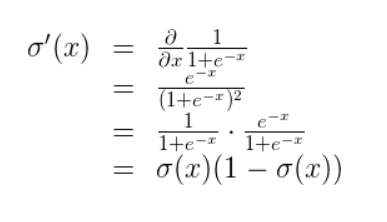

## Overfitting and Underfitting

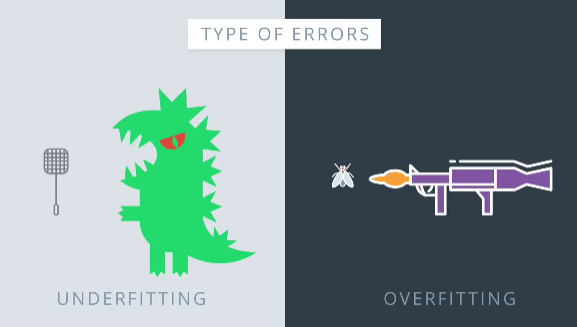

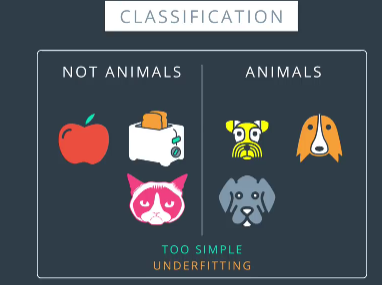

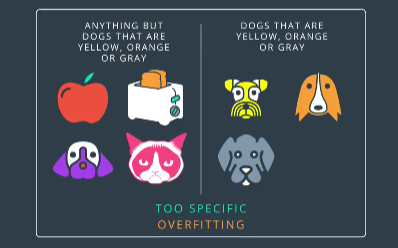

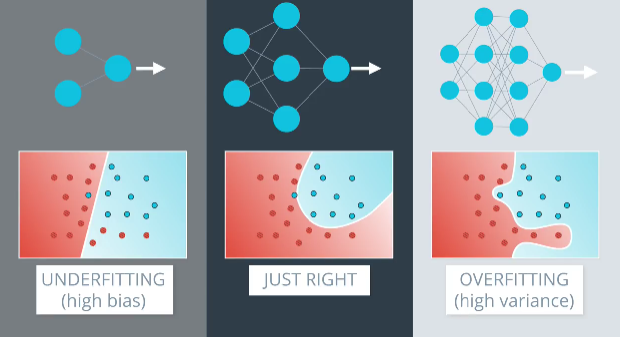

### Early Stopping

**Model Complexity Graph**

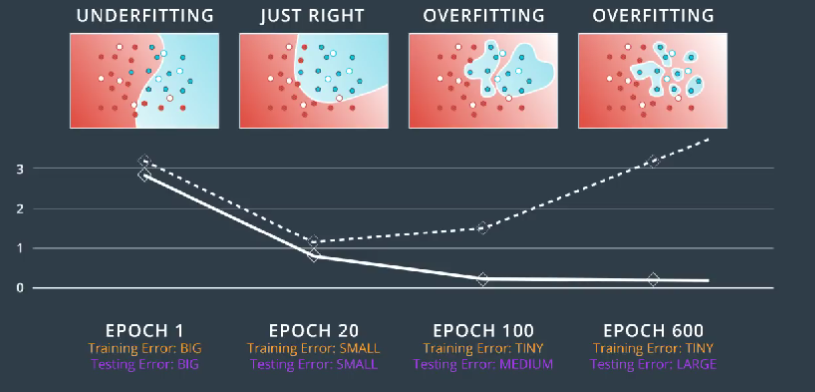

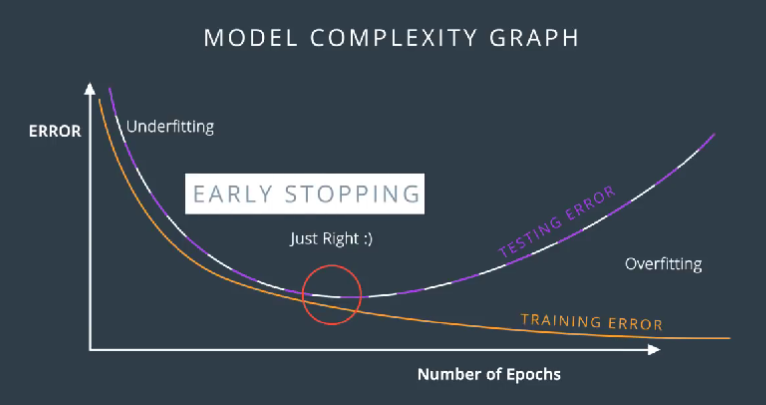

# Convolutional Layers

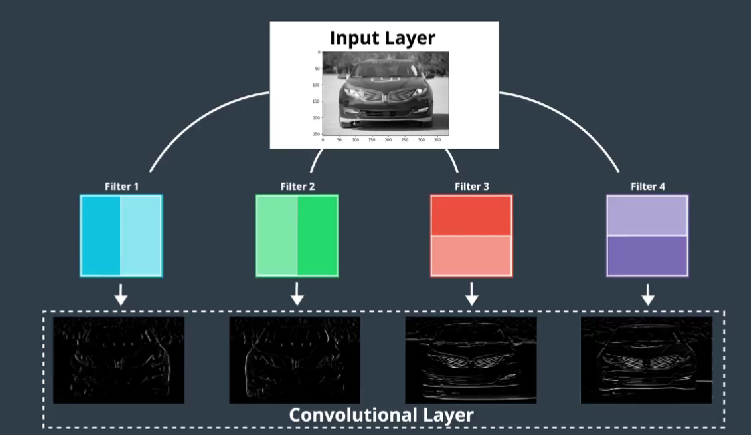

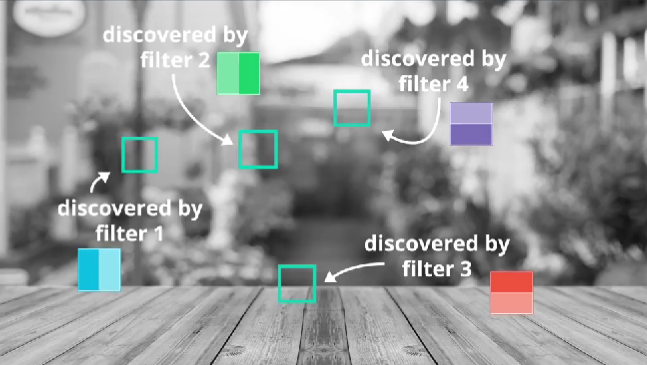

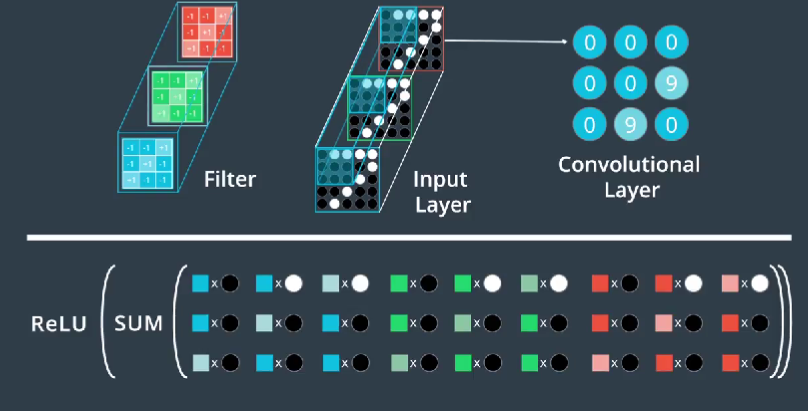

In [7]:
pip install torch

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## Defining Layers in PyTorch

In PyTorch, a neural network is typically defined using layers, also known as modules. These layers are building blocks that can be stacked together to create a deep learning model. PyTorch provides a wide range of pre-defined layers, and you can also create custom layers. 

### Fully-connected (linear) layers
To define a neural network in PyTorch, you'll create and name a new neural network class, define the layers of the network in a function __init__ and define the feedforward behavior of the network that employs those initialized layers in the function **forward**, which takes in an input image tensor, **x**. The structure of such a class, called **Net** is shown below.

Note: During training, PyTorch will be able to perform backpropagation by keeping track of the network's feedforward behavior and using autograd to calculate the update to the weights in the network.

In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [9]:
class Net(nn.Module):

    def __init__(self, n_classes):
        super(Net, self).__init__()

        # 1 input image channel (grayscale), 32 output channels/feature maps
        # 5x5 square convolution kernel
        self.conv1 = nn.Conv2d(1, 32, 5)

        # maxpool layer
        # pool with kernel_size=2, stride=2
        self.pool = nn.MaxPool2d(2, 2)

        # fully-connected layer
        # 32*4 input size to account for the downsampled image size after pooling
        # num_classes outputs (for n_classes of image data)
        self.fc1 = nn.Linear(32*4, n_classes)

    # define the feedforward behavior
    def forward(self, x):
        # one conv/relu + pool layers
        x = self.pool(F.relu(self.conv1(x)))

        # prep for linear layer by flattening the feature maps into feature vectors
        x = x.view(x.size(0), -1)
        # linear layer 
        x = F.relu(self.fc1(x))

        # final output
        return x

# instantiate and print your Net
n_classes = 20 # example number of classes
net = Net(n_classes)
print(net)

Net(
  (conv1): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=128, out_features=20, bias=True)
)


Let's go over the details of what is happening in this code.

### Define the Layers in __init__

Convolutional and maxpooling layers are defined in __init__:

.# 1 input image channel (for grayscale images), 32 output channels/feature maps, 3x3 square convolution kernel

self.conv1 = nn.Conv2d(1, 32, 3)

.# maxpool that uses a square window of kernel_size=2, stride=2

self.pool = nn.MaxPool2d(2, 2) 

### Refer to Layers in forward

Then these layers are referred to in the forward function like this, in which the conv1 layer has a ReLu activation applied to it before maxpooling is applied:

x = self.pool(F.relu(self.conv1(x)))

Best practice is to place any layers whose weights will change during the training process in __init__ and refer to them in the forward function; any layers or functions that always behave in the same way, such as a pre-defined activation function, may appear in the __init__ or in the forward function; it is mostly a matter of style and readability.

## Conv Layer Visualization

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

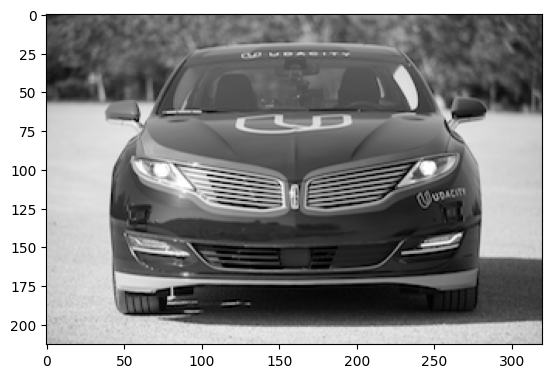

In [11]:
img_path = 'img/udacity_sdc.png'

# load color image 
bgr_img = cv2.imread(img_path)
# convert to grayscale
gray_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2GRAY)

# normalize, rescale entries to lie in [0,1]
gray_img = gray_img.astype("float32")/255

# plot image
plt.imshow(gray_img, cmap='gray')
plt.show()

### Define and visualize the filters

In [12]:
filter_vals = np.array([[-1, -1, 1, 1], [-1, -1, 1, 1], [-1, -1, 1, 1], [-1, -1, 1, 1]])

print('Filter shape: ', filter_vals.shape)

Filter shape:  (4, 4)


In [13]:
# Defining four different filters, 
# all of which are linear combinations of the `filter_vals` defined above

# define four filters
filter_1 = filter_vals
filter_2 = -filter_1
filter_3 = filter_1.T
filter_4 = -filter_3
filters = np.array([filter_1, filter_2, filter_3, filter_4])

# For an example, print out the values of filter 1
print('Filter 1: \n', filter_1)

Filter 1: 
 [[-1 -1  1  1]
 [-1 -1  1  1]
 [-1 -1  1  1]
 [-1 -1  1  1]]


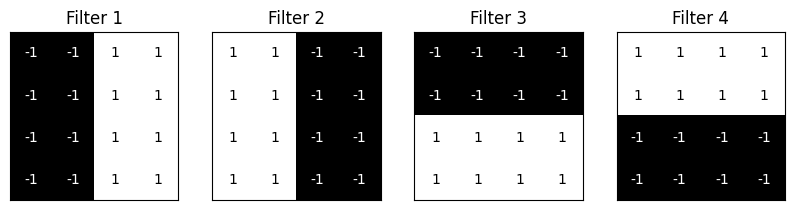

In [14]:
# visualize all four filters
fig = plt.figure(figsize=(10, 5))
for i in range(4):
    ax = fig.add_subplot(1, 4, i+1, xticks=[], yticks=[])
    ax.imshow(filters[i], cmap='gray')
    ax.set_title('Filter %s' % str(i+1))
    width, height = filters[i].shape
    for x in range(width):
        for y in range(height):
            ax.annotate(str(filters[i][x][y]), xy=(y,x),
                        horizontalalignment='center',
                        verticalalignment='center',
                        color='white' if filters[i][x][y]<0 else 'black')

### Define a convolutional layer

Initialize a single convolutional layer so that it contains all your created filters. Note that you are not training this network; you are initializing the weights in a convolutional layer so that you can visualize what happens after a forward pass through this network!

In [15]:
# define a neural network with a single convolutional layer with four filters
class Net(nn.Module):
    
    def __init__(self, weight):
        super(Net, self).__init__()
        # initializes the weights of the convolutional layer to be the weights of the 4 defined filters
        k_height, k_width = weight.shape[2:]
        # assumes there are 4 grayscale filters
        self.conv = nn.Conv2d(1, 4, kernel_size=(k_height, k_width), bias=False)
        self.conv.weight = torch.nn.Parameter(weight)

    def forward(self, x):
        # calculates the output of a convolutional layer
        # pre- and post-activation
        conv_x = self.conv(x)
        activated_x = F.relu(conv_x)
        
        # returns both layers
        return conv_x, activated_x
    
# instantiate the model and set the weights
weight = torch.from_numpy(filters).unsqueeze(1).type(torch.FloatTensor)
model = Net(weight)

# print out the layer in the network
print(model)

Net(
  (conv): Conv2d(1, 4, kernel_size=(4, 4), stride=(1, 1), bias=False)
)


### Visualize the output of each filter

First, we'll define a helper function, viz_layer that takes in a specific layer and number of filters (optional argument), and displays the output of that layer once an image has been passed through.

In [16]:
# helper function for visualizing the output of a given layer
# default number of filters is 4
def viz_layer(layer, n_filters= 4):
    fig = plt.figure(figsize=(20, 20))
    
    for i in range(n_filters):
        ax = fig.add_subplot(1, n_filters, i+1, xticks=[], yticks=[])
        # grab layer outputs
        ax.imshow(np.squeeze(layer[0,i].data.numpy()), cmap='gray')
        ax.set_title('Output %s' % str(i+1))

Let's look at the output of a convolutional layer, before and after a ReLu activation function is applied.

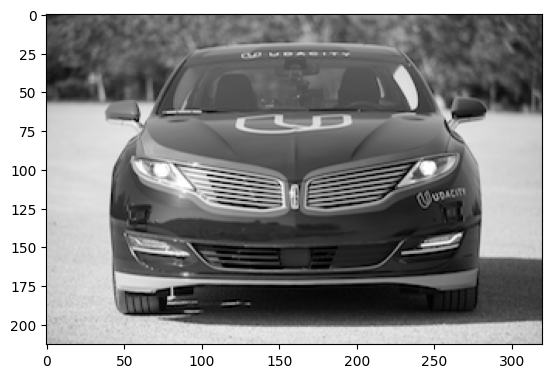

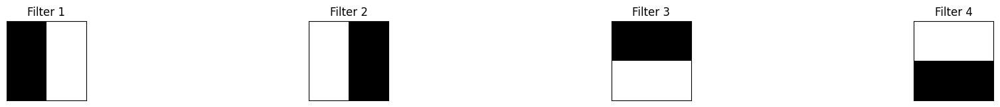

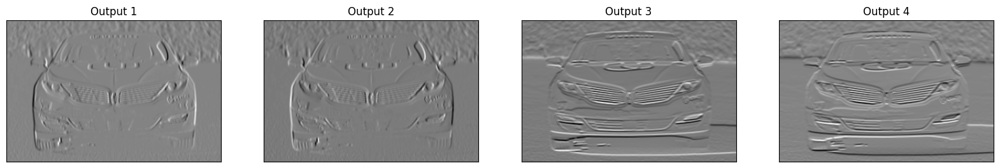

In [17]:
# plot original image
plt.imshow(gray_img, cmap='gray')

# visualize all filters
fig = plt.figure(figsize=(12, 6))
fig.subplots_adjust(left=0, right=1.5, bottom=0.8, top=1, hspace=0.05, wspace=0.05)
for i in range(4):
    ax = fig.add_subplot(1, 4, i+1, xticks=[], yticks=[])
    ax.imshow(filters[i], cmap='gray')
    ax.set_title('Filter %s' % str(i+1))

    
# convert the image into an input Tensor
gray_img_tensor = torch.from_numpy(gray_img).unsqueeze(0).unsqueeze(1)

# get the convolutional layer (pre and post activation)
conv_layer, activated_layer = model(gray_img_tensor)

# visualize the output of a conv layer
viz_layer(conv_layer)

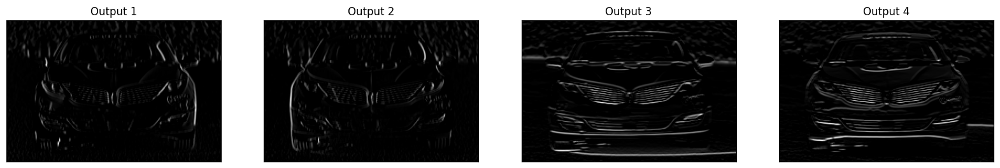

In [18]:
# after a ReLu is applied
# visualize the output of an activated conv layer
viz_layer(activated_layer)

**Histogram of Activations:** You can plot histograms of the activations of the convolutional layer to get a sense of how different filters respond to different features in the input image. This can help you understand the distribution of activations for each filter.

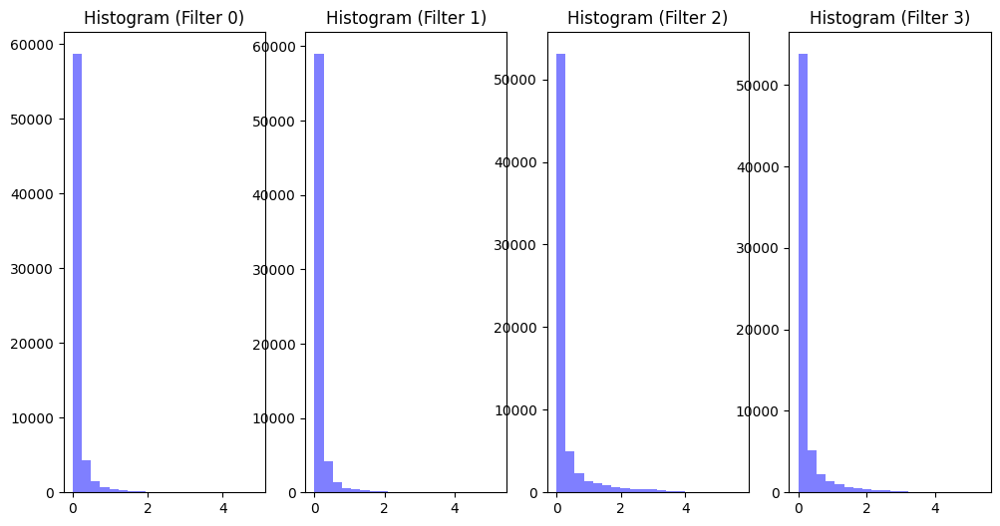

In [19]:
# Plot histograms of activations for all filters in the activated layer
plt.figure(figsize=(12, 6))
for i in range(4):
    plt.subplot(1, 4, i+1)
    plt.hist(activated_layer[0, i].data.numpy().ravel(), bins=20, color='b', alpha=0.5)
    plt.title('Histogram (Filter {})'.format(i))

**Feature Map Visualization:** Visualize the feature maps produced by the filters in the convolutional layer. These feature maps represent the presence of specific patterns or features in the input image.

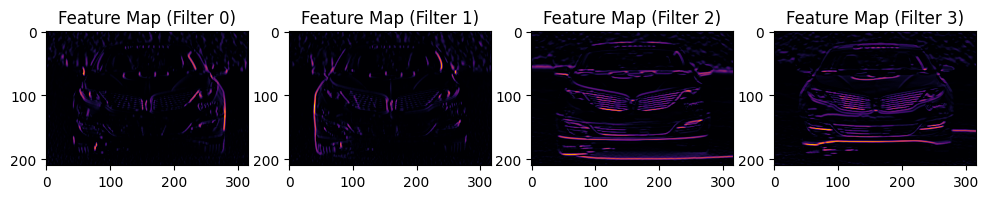

In [20]:
# Visualize feature maps from the activated layer
plt.figure(figsize=(12, 6))
for i in range(4):
    plt.subplot(1, 4, i+1)
    plt.imshow(activated_layer[0, i].data.numpy(), cmap='inferno')
    plt.title('Feature Map (Filter {})'.format(i))

**Visualizing Filters in the Frequency Domain:** Convert the filters to the frequency domain using Fourier Transform and visualize them. This can help you understand the frequency characteristics of your filters.

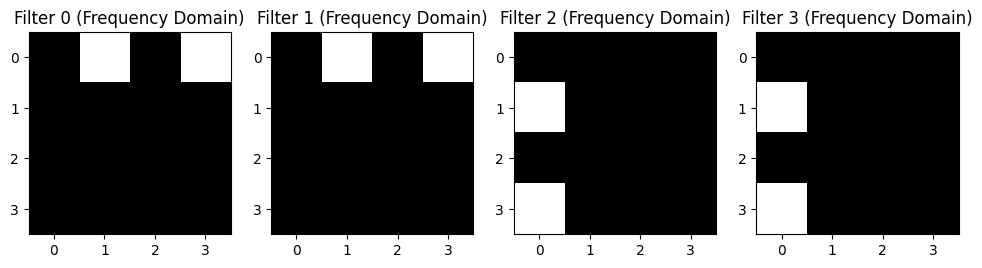

In [21]:
from scipy.fftpack import fft2

# Calculate and plot the Fourier Transform of the filters
plt.figure(figsize=(12, 6))
for i in range(4):
    filter_fft = fft2(filters[i])
    plt.subplot(1, 4, i+1)
    plt.imshow(np.abs(filter_fft), cmap='gray')
    plt.title('Filter {} (Frequency Domain)'.format(i))

**Feature Map Superposition:** Superimpose the activation maps of multiple filters to visualize how they interact and detect different features in the same image. This can provide insights into the interplay of filters.

(-0.5, 316.5, 209.5, -0.5)

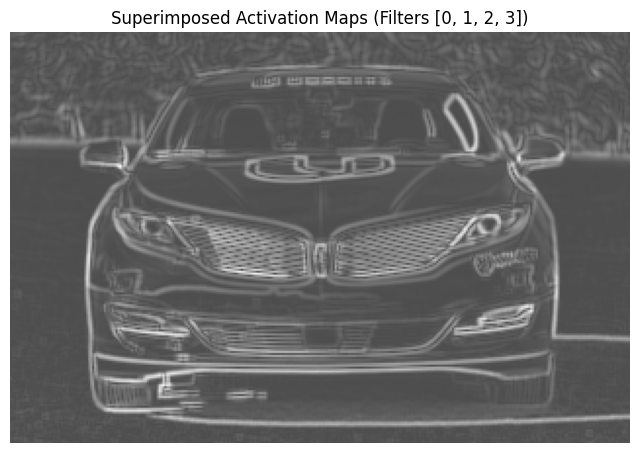

In [22]:
# Superimpose activation maps of multiple filters
filter_indices = [0, 1, 2, 3]  # Change this list to select specific filters
superimposed_map = np.zeros_like(activated_layer[0, 0].data.numpy())

for i in filter_indices:
    superimposed_map += activated_layer[0, i].data.numpy()

plt.figure(figsize=(8, 6))
plt.imshow(superimposed_map, cmap='gray', alpha=0.7)
plt.title('Superimposed Activation Maps (Filters {})'.format(filter_indices))
plt.axis('off')

## Pooling, VGG-16 Architecture

Take a look at the layers after the initial convolutional layers in the VGG-16 architecture

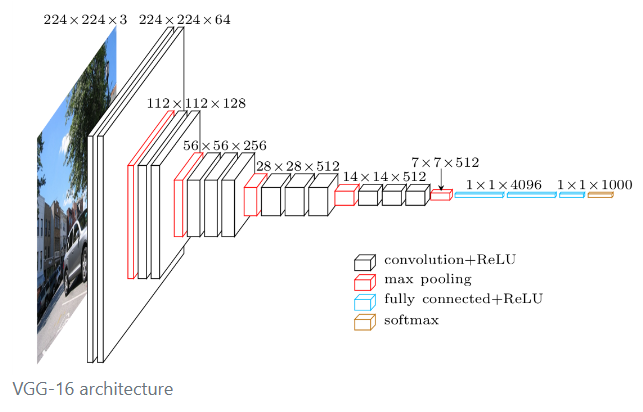

After a couple of convolutional layers (+ReLu's), in the VGG-16 network, you'll see a maxpooling layer.

* Pooling layers take in an image (usually a filtered image) and output a reduced version of that image
* Pooling layers reduce the dimensionality of an input
* **Maxpooling** layers look at areas in an input image (like the 4x4 pixel area pictured below) and choose to keep the maximum pixel value in that area, in a new, reduced-size area.
* Maxpooling is the most common type of pooling layer in CNN's, but there are also other types such as average pooling.

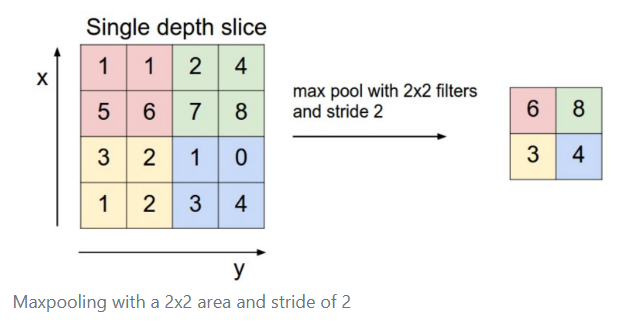

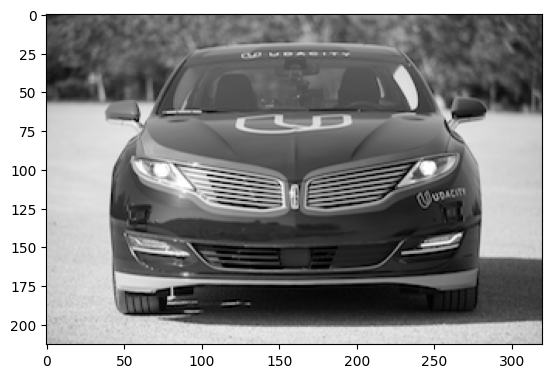

In [23]:
# plot image
plt.imshow(gray_img, cmap='gray')
plt.show()

In [24]:
# define a neural network with a convolutional layer with four filters
# AND a pooling layer of size (4, 4)
class Net(nn.Module):
    
    def __init__(self, weight):
        super(Net, self).__init__()
        # initializes the weights of the convolutional layer to be the weights of the 4 defined filters
        k_height, k_width = weight.shape[2:]
        # assumes there are 4 grayscale filters
        self.conv = nn.Conv2d(1, 4, kernel_size=(k_height, k_width), bias=False)
        self.conv.weight = torch.nn.Parameter(weight)
        # define a pooling layer
        self.pool = nn.MaxPool2d(4, 4)

    def forward(self, x):
        # calculates the output of a convolutional layer
        # pre- and post-activation
        conv_x = self.conv(x)
        activated_x = F.relu(conv_x)
        
        # applies pooling layer
        pooled_x = self.pool(activated_x)
        
        # returns all layers
        return conv_x, activated_x, pooled_x
    
# instantiate the model and set the weights
weight = torch.from_numpy(filters).unsqueeze(1).type(torch.FloatTensor)
model = Net(weight)

# print out the layer in the network
print(model)

Net(
  (conv): Conv2d(1, 4, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (pool): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
)


In [25]:
def viz_layer(layer, n_filters= 4):
    fig = plt.figure(figsize=(20, 20))
    
    for i in range(n_filters):
        ax = fig.add_subplot(1, n_filters, i+1, xticks=[], yticks=[])
        # grab layer outputs
        ax.imshow(np.squeeze(layer[0,i].data.numpy()), cmap='gray')
        ax.set_title('Output %s' % str(i+1))

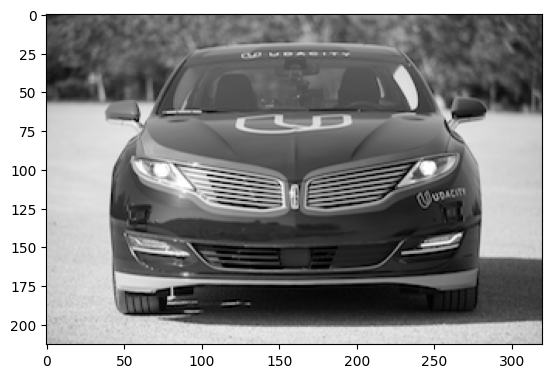

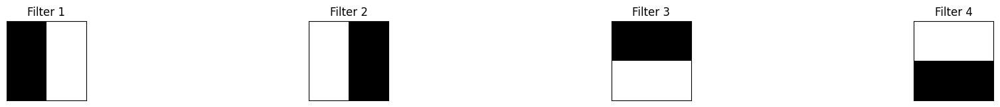

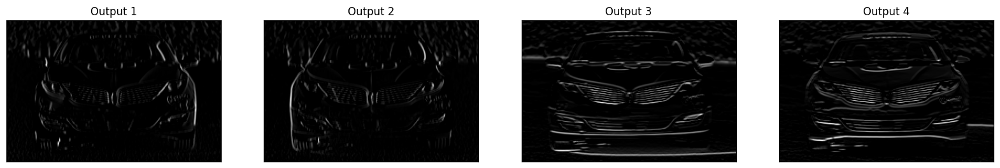

In [26]:
# plot original image
plt.imshow(gray_img, cmap='gray')

# visualize all filters
fig = plt.figure(figsize=(12, 6))
fig.subplots_adjust(left=0, right=1.5, bottom=0.8, top=1, hspace=0.05, wspace=0.05)
for i in range(4):
    ax = fig.add_subplot(1, 4, i+1, xticks=[], yticks=[])
    ax.imshow(filters[i], cmap='gray')
    ax.set_title('Filter %s' % str(i+1))

    
# convert the image into an input Tensor
gray_img_tensor = torch.from_numpy(gray_img).unsqueeze(0).unsqueeze(1)

# get all the layers 
conv_layer, activated_layer, pooled_layer = model(gray_img_tensor)

# visualize the output of the activated conv layer
viz_layer(activated_layer)

### Visualize the output of the pooling layer
Then, take a look at the output of a pooling layer. The pooling layer takes as input the feature maps pictured above and reduces the dimensionality of those maps, by some pooling factor, by constructing a new, smaller image of only the maximum (brightest) values in a given kernel area.

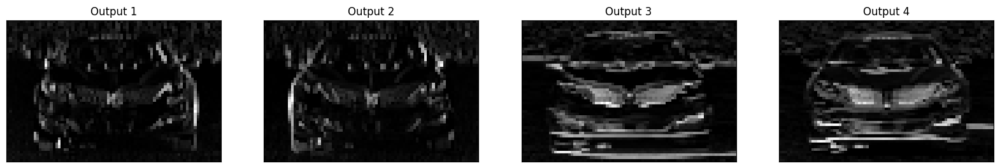

In [27]:
# visualize the output of the pooling layer
viz_layer(pooled_layer)

Take a look at the layers near the end of this model; the fully-connected layers that come after a series of convolutional and pooling layers. Take note of their flattened shape.

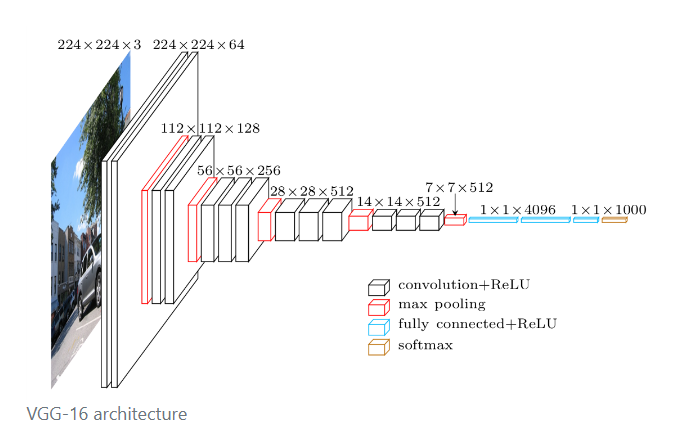

### Fully-Connected Layer

A fully-connected layer's job is to connect the input it sees to a desired form of output. Typically, this means converting a matrix of image features into a feature vector whose dimensions are 1xC, where C is the number of classes. As an example, say we are sorting images into ten classes, you could give a fully-connected layer a set of [pooled, activated] feature maps as input and tell it to use a combination of these features (multiplying them, adding them, combining them, etc.) to output a 10-item long feature vector. This vector compresses the information from the feature maps into a single feature vector.

### Softmax

The very last layer you see in this network is a softmax function. The softmax function, can take any vector of values as input and returns a vector of the same length whose values are all in the range (0, 1) and, together, these values will add up to 1. This function is often seen in classification models that have to turn a feature vector into a probability distribution.

Consider the same example again; a network that groups images into one of 10 classes. The fully-connected layer can turn feature maps into a single feature vector that has dimensions 1x10. Then the softmax function turns that vector into a 10-item long probability distribution in which each number in the resulting vector represents the probability that a given input image falls in class 1, class 2, class 3, … class 10. This output is sometimes called the class scores and from these scores, you can extract the most likely class for the given image!

### Overfitting

Convolutional, pooling, and fully-connected layers are all you need to construct a complete CNN, but there are additional layers that you can add to avoid overfitting, too. One of the most common layers to add to prevent overfitting is a dropout layer.

Dropout layers essentially turn off certain nodes in a layer with some probability, p. This ensures that all nodes get an equal chance to try and classify different images during training, and it reduces the likelihood that only a few, heavily-weighted nodes will dominate the process.

# Load and Visualize FashionMNIST

In [28]:
pip install torch torchvision

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [29]:
# our basic libraries
import torchvision

# data loading and transforming
from torchvision.datasets import FashionMNIST
from torch.utils.data import DataLoader
from torchvision import transforms

In [30]:
# The output of torchvision datasets are PILImage images of range [0, 1]. 
# We transform them to Tensors for input into a CNN

## Define a transform to read the data in as a tensor
data_transform = transforms.ToTensor()

# choose the training and test datasets
train_data = FashionMNIST(root='img/data', train=True,
                         download=False, transform=data_transform)

# Print out some stats about the training data
print('Train data, number of images: ', len(train_data))

Train data, number of images:  60000


### Data iteration and batching

Next, we'll use torch.utils.data.DataLoader , which is an iterator that allows us to batch and shuffle the data.

In the next cell, we shuffle the data and load in image/label data in batches of size 20.

In [39]:
# prepare data loaders, set the batch_size
## TODO: you can try changing the batch_size to be larger or smaller
## when you get to training your network, see how batch_size affects the loss
batch_size = 20

train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=True)

# specify the image classes
classes = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 
           'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

### Visualize some training data

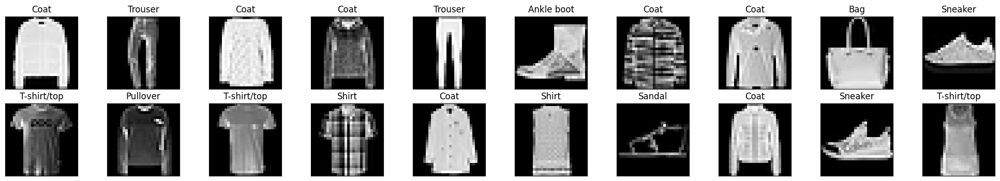

In [32]:
# Obtain one batch of training images
for images, labels in train_loader:
    # Convert images to NumPy array
    images = images.numpy()
    
    # Plot the images in the batch, along with the corresponding labels
    fig = plt.figure(figsize=(25, 4))
    for idx in np.arange(batch_size):
        ax = fig.add_subplot(2, batch_size // 2, idx+1, xticks=[], yticks=[])
        ax.imshow(np.squeeze(images[idx]), cmap='gray')
        ax.set_title(classes[labels[idx]])
    break  # Exit the loop after one batch if needed

### View an image in more detail

Each image in this dataset is a 28x28 pixel, normalized, grayscale image.

#### A note on normalization

Normalization ensures that, as we go through a feedforward and then backpropagation step in training our CNN, that each image feature will fall within a similar range of values and not overly activate any particular layer in our network. During the feedfoward step, a network takes in an input image and multiplies each input pixel by some convolutional filter weights (and adds biases!), then it applies some activation and pooling functions. Without normalization, it's much more likely that the calculated gradients in the backpropagaton step will be quite large and cause our loss to increase instead of converge.

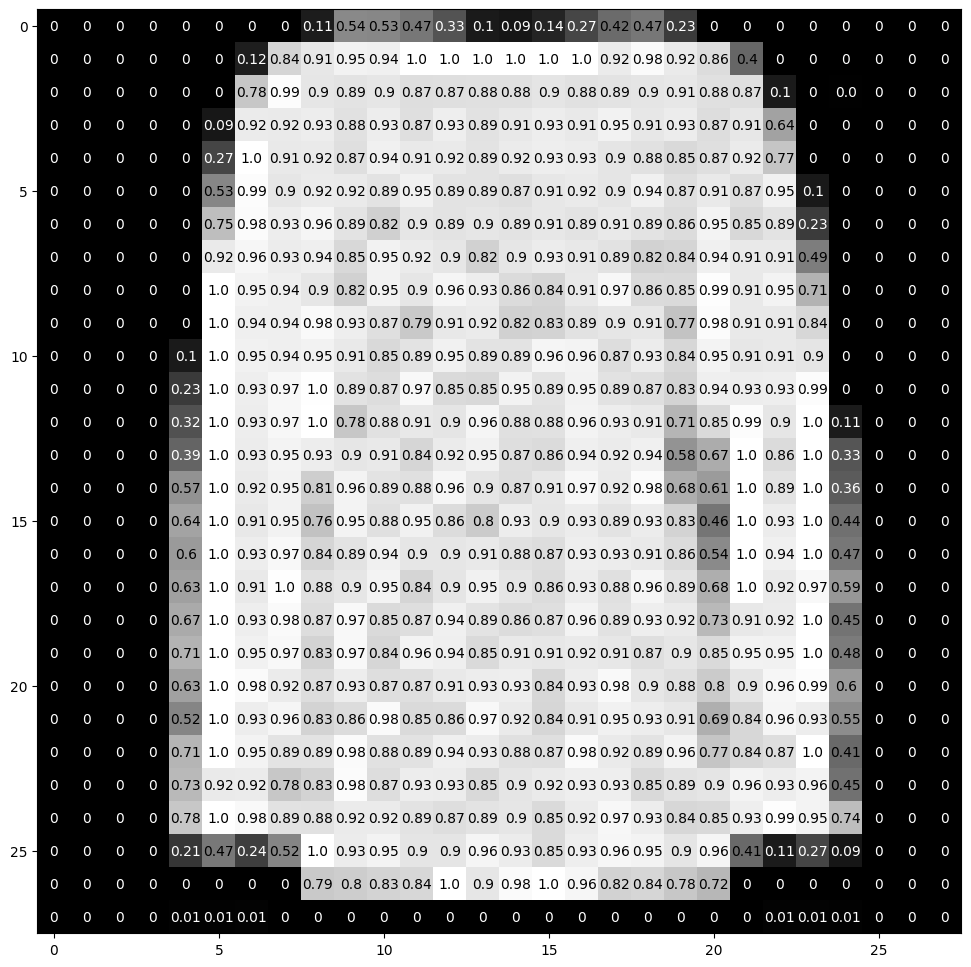

In [33]:
# select an image by index
idx = 2
img = np.squeeze(images[idx])

# display the pixel values in that image
fig = plt.figure(figsize = (12,12)) 
ax = fig.add_subplot(111)
ax.imshow(img, cmap='gray')
width, height = img.shape
thresh = img.max()/2.5
for x in range(width):
    for y in range(height):
        val = round(img[x][y],2) if img[x][y] !=0 else 0
        ax.annotate(str(val), xy=(y,x),
                    horizontalalignment='center',
                    verticalalignment='center',
                    color='white' if img[x][y]<thresh else 'black')

## Training in PyTorch

Once you've loaded a training dataset, next your job will be to define a CNN and train it to classify that set of images.

### Loss and Optimizer

To train a model, you'll need to define how it trains by selecting a loss function and optimizer. These functions decide how the model updates its parameters as it trains and can affect how quickly the model converges, as well.

For a classification problem like this, one typically uses cross entropy loss, which can be defined in code like: criterion = nn.CrossEntropyLoss(). PyTorch also includes some standard stochastic optimizers like stochastic gradient descent and Adam. You're encouraged to try different optimizers and see how your model responds to these choices as it trains.

### Clasisification vs. Regression

The loss function you should choose depends on the kind of CNN you are trying to create; cross entropy is generally good for classification tasks, but you might choose a different loss function for, say, a regression problem that tried to predict (x,y) locations for the center or edges of clothing items instead of class scores.

### Training the Network
Typically, we train any network for a number of epochs or cycles through the training dataset

Here are the steps that a training function performs as it iterates over the training dataset:

* Prepares all input images and label data for training
* Passes the input through the network (forward pass)
* Computes the loss (how far is the predicted classes are from the correct labels)
* Propagates gradients back into the network’s parameters (backward pass)
* Updates the weights (parameter update)

It repeats this process until the average loss has sufficiently decreased.

## CNN for Classification

In [34]:
# The output of torchvision datasets are PILImage images of range [0, 1]. 
# We transform them to Tensors for input into a CNN

## Define a transform to read the data in as a tensor
data_transform = transforms.ToTensor()

# choose the training and test datasets
train_data = FashionMNIST(root='img/data', train=True,
                                   download=True, transform=data_transform)

test_data = FashionMNIST(root='img/data', train=False,
                                  download=True, transform=data_transform)


# Print out some stats about the training and test data
print('Train data, number of images: ', len(train_data))
print('Test data, number of images: ', len(test_data))

Train data, number of images:  60000
Test data, number of images:  10000


In [35]:
data_transform

ToTensor()

### Define the network architecture

The various layers that make up any neural network are documented, here. For a convolutional neural network, we'll use a simple series of layers:

* Convolutional layers
* Maxpooling layers
* Fully-connected (linear) layers

You are also encouraged to look at adding dropout layers to avoid overfitting this data.

To define a neural network in PyTorch, you define the layers of a model in the function __init__ and define the feedforward behavior of a network that employs those initialized layers in the function forward, which takes in an input image tensor, x. The structure of this Net class is shown below and left for you to fill in.

Note: During training, PyTorch will be able to perform backpropagation by keeping track of the network's feedforward behavior and using autograd to calculate the update to the weights in the network.

### Define the Layers in __init__

As a reminder, a conv/pool layer may be defined like this (in __init__):

.# 1 input image channel (for grayscale images), 32 output channels/feature maps, 3x3 square convolution kernel
self.conv1 = nn.Conv2d(1, 32, 3)

.# maxpool that uses a square window of kernel_size=2, stride=2
self.pool = nn.MaxPool2d(2, 2) 

### Refer to Layers in forward

Then referred to in the forward function like this, in which the conv1 layer has a ReLu activation applied to it before maxpooling is applied:

x = self.pool(F.relu(self.conv1(x)))

You must place any layers with trainable weights, such as convolutional layers, in the __init__ function and refer to them in the forward function; any layers or functions that always behave in the same way, such as a pre-defined activation function, may appear only in the forward function. In practice, you'll often see conv/pool layers defined in __init__ and activations defined in forward.

### Convolutional layer

The first convolution layer has been defined for you, it takes in a 1 channel (grayscale) image and outputs 10 feature maps as output, after convolving the image with 3x3 filters.

### Flattening

Recall that to move from the output of a convolutional/pooling layer to a linear layer, you must first flatten your extracted features into a vector. If you've used the deep learning library, Keras, you may have seen this done by Flatten(), and in PyTorch you can flatten an input x with x = x.view(x.size(0), -1).

For any convolutional layer, the output feature maps will have the specified depth (a depth of 10 for 10 filters in a convolutional layer) and the dimensions of the produced feature maps (width/height) can be computed as the input image width/height, W, minus the filter size, F, divided by the stride, S, all + 1. The equation looks like: output_dim = (W-F)/S + 1, for an assumed padding size of 0. 

For a pool layer with a size 2 and stride 2, the output dimension will be reduced by a factor of 2. Read the comments in the code below to see the output size for each layer.

In [36]:
class Net(nn.Module):

    def __init__(self):
        super(Net, self).__init__()
        
        # 1 input image channel (grayscale), 10 output channels/feature maps
        # 3x3 square convolution kernel
        ## output size = (W-F)/S +1 = (28-3)/1 +1 = 26
        # the output Tensor for one image, will have the dimensions: (10, 26, 26)
        # after one pool layer, this becomes (10, 13, 13)
        self.conv1 = nn.Conv2d(1, 10, 3)
        
        # maxpool layer
        # pool with kernel_size=2, stride=2
        self.pool = nn.MaxPool2d(2, 2)
        
        # second conv layer: 10 inputs, 20 outputs, 3x3 conv
        ## output size = (W-F)/S +1 = (13-3)/1 +1 = 11
        # the output tensor will have dimensions: (20, 11, 11)
        # after another pool layer this becomes (20, 5, 5); 5.5 is rounded down
        self.conv2 = nn.Conv2d(10, 20, 3)
        
        # 20 outputs * the 5*5 filtered/pooled map size
        # 10 output channels (for the 10 classes)
        self.fc1 = nn.Linear(20*5*5, 10)
        
    # define the feedforward behavior
    def forward(self, x):
        # two conv/relu + pool layers
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))

        # prep for linear layer
        # flatten the inputs into a vector
        x = x.view(x.size(0), -1)
        
        # one linear layer
        x = self.fc1(x)
        # a softmax layer to convert the 10 outputs into a distribution of class scores
        x = F.log_softmax(x, dim=1)
        
        # final output
        return x

# instantiate and print your Net
net = Net()
print(net)

Net(
  (conv1): Conv2d(1, 10, kernel_size=(3, 3), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=500, out_features=10, bias=True)
)


Note that for a classification problem like this, one typically uses cross entropy loss, which can be defined in code like: criterion = nn.CrossEntropyLoss(); cross entropy loss combines softmax and NLL loss so, alternatively (as in this example), you may see NLL Loss being used when the output of our Net is a distribution of class scores.

PyTorch also includes some standard stochastic optimizers like stochastic gradient descent and Adam. You're encouraged to try different optimizers and see how your model responds to these choices as it trains.

In [37]:
import torch.optim as optim

## TODO: specify loss function 
# cross entropy loss combines softmax and nn.NLLLoss() in one single class.
criterion = nn.NLLLoss()

## TODO: specify optimizer 
# stochastic gradient descent with a small learning rate
optimizer = optim.SGD(net.parameters(), lr=0.001)

### A note on accuracy

It's interesting to look at the accuracy of your network before and after training. This way you can really see that your network has learned something. In the next cell, let's see what the accuracy of an untrained network is (we expect it to be around 10% which is the same accuracy as just guessing for all 10 classes).

In [40]:
# Calculate accuracy before training
correct = 0
total = 0

# Iterate through test dataset
for images, labels in test_loader:

    # forward pass to get outputs
    # the outputs are a series of class scores
    outputs = net(images)

    # get the predicted class from the maximum value in the output-list of class scores
    _, predicted = torch.max(outputs.data, 1)

    # count up total number of correct labels
    # for which the predicted and true labels are equal
    total += labels.size(0)
    correct += (predicted == labels).sum()

# calculate the accuracy
# to convert `correct` from a Tensor into a scalar, use .item()
accuracy = 100.0 * correct.item() / total

# print it out!
print('Accuracy before training: ', accuracy)

Accuracy before training:  16.42


### Train the Network

Below, we've defined a train function that takes in a number of epochs to train for.

* The number of epochs is how many times a network will cycle through the entire training dataset.
* Inside the epoch loop, we loop over the training dataset in batches; recording the loss every 1000 batches.

Here are the steps that this training function performs as it iterates over the training dataset:

  1. Zero's the gradients to prepare for a forward pass
  2. Passes the input through the network (forward pass)
  3. Computes the loss (how far is the predicted classes are from the correct labels)
  4. Propagates gradients back into the network’s parameters (backward pass)
  5. Updates the weights (parameter update)
  6. Prints out the calculated loss

In [41]:
def train(n_epochs):
    
    loss_over_time = [] # to track the loss as the network trains
    
    for epoch in range(n_epochs):  # loop over the dataset multiple times
        
        running_loss = 0.0
        
        for batch_i, data in enumerate(train_loader):
            # get the input images and their corresponding labels
            inputs, labels = data

            # zero the parameter (weight) gradients
            optimizer.zero_grad()

            # forward pass to get outputs
            outputs = net(inputs)

            # calculate the loss
            loss = criterion(outputs, labels)

            # backward pass to calculate the parameter gradients
            loss.backward()

            # update the parameters
            optimizer.step()

            # print loss statistics
            # to convert loss into a scalar and add it to running_loss, we use .item()
            running_loss += loss.item()
            
            if batch_i % 1000 == 999:    # print every 1000 batches
                avg_loss = running_loss/1000
                # record and print the avg loss over the 1000 batches
                loss_over_time.append(avg_loss)
                print('Epoch: {}, Batch: {}, Avg. Loss: {}'.format(epoch + 1, batch_i+1, avg_loss))
                running_loss = 0.0

    print('Finished Training')
    return loss_over_time

In [42]:
# define the number of epochs to train for
n_epochs = 30 # start small to see if your model works, initially

# call train and record the loss over time
training_loss = train(n_epochs)

Epoch: 1, Batch: 1000, Avg. Loss: 2.178902408003807
Epoch: 1, Batch: 2000, Avg. Loss: 1.4560839967131616
Epoch: 1, Batch: 3000, Avg. Loss: 0.9704370561540127
Epoch: 2, Batch: 1000, Avg. Loss: 0.8715951263606548
Epoch: 2, Batch: 2000, Avg. Loss: 0.7997726517319679
Epoch: 2, Batch: 3000, Avg. Loss: 0.7779838878661394
Epoch: 3, Batch: 1000, Avg. Loss: 0.7374857222288846
Epoch: 3, Batch: 2000, Avg. Loss: 0.7273957665860653
Epoch: 3, Batch: 3000, Avg. Loss: 0.7081726730465889
Epoch: 4, Batch: 1000, Avg. Loss: 0.6904009697735309
Epoch: 4, Batch: 2000, Avg. Loss: 0.6759691077321768
Epoch: 4, Batch: 3000, Avg. Loss: 0.6520817754268646
Epoch: 5, Batch: 1000, Avg. Loss: 0.6457553418427706
Epoch: 5, Batch: 2000, Avg. Loss: 0.630346654266119
Epoch: 5, Batch: 3000, Avg. Loss: 0.622788104891777
Epoch: 6, Batch: 1000, Avg. Loss: 0.6079019426852464
Epoch: 6, Batch: 2000, Avg. Loss: 0.5991834080293774
Epoch: 6, Batch: 3000, Avg. Loss: 0.5945269971936941
Epoch: 7, Batch: 1000, Avg. Loss: 0.5829708841294

### Visualizing the loss

A good indication of how much your network is learning as it trains is the loss over time. In this example, we printed and recorded the average loss for each 1000 batches and for each epoch. Let's plot it and see how the loss decreases (or doesn't) over time.

In this case, you can see that it takes a little bit for a big initial loss decrease, and the loss is flattening out over time.

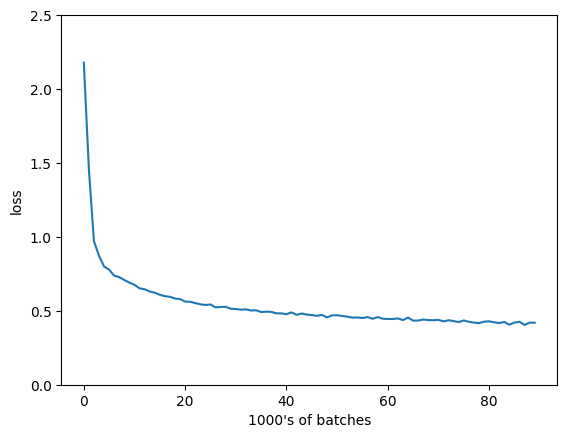

In [43]:
# visualize the loss as the network trained
plt.plot(training_loss)
plt.xlabel('1000\'s of batches')
plt.ylabel('loss')
plt.ylim(0, 2.5) # consistent scale
plt.show()

### Test the Trained Network

Once you are satisfied with how the loss of your model has decreased, there is one last step: test!

You must test your trained model on a previously unseen dataset to see if it generalizes well and can accurately classify this new dataset. For FashionMNIST, which contains many pre-processed training images, a good model should reach greater than 85% accuracy on this test dataset. If you are not reaching this value, try training for a larger number of epochs, tweaking your hyperparameters, or adding/subtracting layers from your CNN.

In [45]:
# initialize tensor and lists to monitor test loss and accuracy
test_loss = torch.zeros(1)
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))

# set the module to evaluation mode
net.eval()

for batch_i, data in enumerate(test_loader):
    
    # get the input images and their corresponding labels
    inputs, labels = data
    
    # forward pass to get outputs
    outputs = net(inputs)

    # calculate the loss
    loss = criterion(outputs, labels)
            
    # update average test loss 
    test_loss = test_loss + ((torch.ones(1) / (batch_i + 1)) * (loss.data - test_loss))
    
    # get the predicted class from the maximum value in the output-list of class scores
    _, predicted = torch.max(outputs.data, 1)
    
    # compare predictions to true label
    # this creates a `correct` Tensor that holds the number of correctly classified images in a batch
    correct = np.squeeze(predicted.eq(labels.data.view_as(predicted)))
    
    # calculate test accuracy for *each* object class
    # we get the scalar value of correct items for a class, by calling `correct[i].item()`
    for i in range(batch_size):
        label = labels.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

print('Test Loss: {:.6f}\n'.format(test_loss.numpy()[0]))

for i in range(10):
    if class_total[i] > 0:
        print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
            classes[i], 100 * class_correct[i] / class_total[i],
            np.sum(class_correct[i]), np.sum(class_total[i])))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

        
print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))

Test Loss: 0.431595

Test Accuracy of T-shirt/top: 80% (801/1000)
Test Accuracy of Trouser: 95% (956/1000)
Test Accuracy of Pullover: 75% (757/1000)
Test Accuracy of Dress: 89% (895/1000)
Test Accuracy of  Coat: 72% (728/1000)
Test Accuracy of Sandal: 95% (958/1000)
Test Accuracy of Shirt: 56% (563/1000)
Test Accuracy of Sneaker: 92% (921/1000)
Test Accuracy of   Bag: 94% (943/1000)
Test Accuracy of Ankle boot: 93% (939/1000)

Test Accuracy (Overall): 84% (8461/10000)


### Visualize sample test results
Format: predicted class (true class)

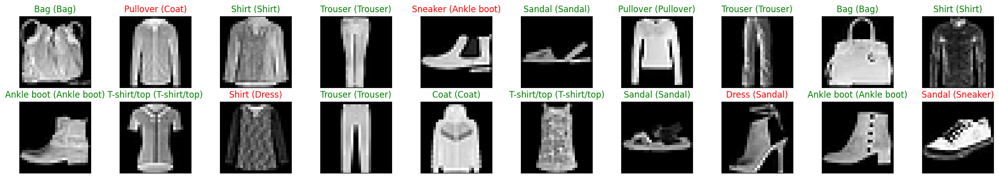

In [48]:
# obtain one batch of test images
dataiter = iter(test_loader)
images, labels = dataiter.__next__()  # Use __next__() instead of next()
# get predictions
preds = np.squeeze(net(images).data.max(1, keepdim=True)[1].numpy())
images = images.numpy()

# plot the images in the batch, along with predicted and true labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(batch_size):
    ax = fig.add_subplot(2, int(batch_size/2), idx+1, xticks=[], yticks=[])  # Convert to integer
    ax.imshow(np.squeeze(images[idx]), cmap='gray')
    ax.set_title("{} ({})".format(classes[preds[idx]], classes[labels[idx]]),
                 color=("green" if preds[idx] == labels[idx] else "red"))

In [50]:
# Saving the model
model_dir = 'img/'
model_name = 'fashion_net_simple.pt'

# after training, save your model parameters in the dir 'saved_models'
# when you're ready, un-comment the line below
torch.save(net.state_dict(), model_dir+model_name)

## Dropout and Momentum

The next cell will show a different (improved) model for clothing classification. It has two main differences when compared to the first solution:

* It has an additional dropout layer
* It includes a momentum term in the optimizer: stochastic gradient descent

So, why are these improvements?

### Dropout

Dropout randomly turns off perceptrons (nodes) that make up the layers of our network, with some specified probability. It may seem counterintuitive to throw away a connection in our network, but as a network trains, some nodes can dominate others or end up making large mistakes, and dropout gives us a way to balance our network so that every node works equally towards the same goal, and if one makes a mistake, it won't dominate the behavior of our model. You can think of dropout as a technique that makes a network resilient; it makes all the nodes work well as a team by making sure no node is too weak or too strong. In fact it makes me think of the Chaos Monkey tool that is used to test for system/website failures.

### Momentum

When you train a network, you specify an optimizer that aims to reduce the errors that your network makes during training. The errors that it makes should generally reduce over time but there may be some bumps along the way. Gradient descent optimization relies on finding a local minimum for an error, but it has trouble finding the global minimum which is the lowest an error can get. So, we add a momentum term to help us find and then move on from local minimums and find the global minimum!

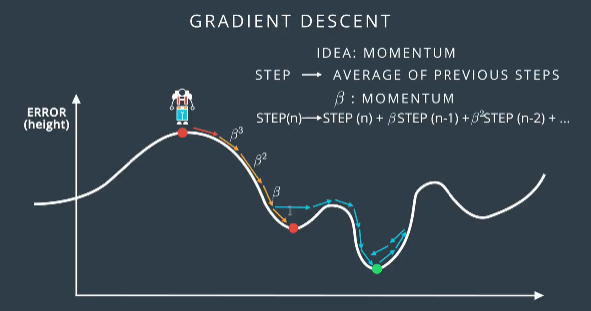

In [51]:
class Net(nn.Module):

    def __init__(self):
        super(Net, self).__init__()
        
        # 1 input image channel (grayscale), 10 output channels/feature maps
        # 3x3 square convolution kernel
        ## output size = (W-F)/S +1 = (28-3)/1 +1 = 26
        # the output Tensor for one image, will have the dimensions: (10, 26, 26)
        # after one pool layer, this becomes (10, 13, 13)
        self.conv1 = nn.Conv2d(1, 10, 3)
        
        # maxpool layer
        # pool with kernel_size=2, stride=2
        self.pool = nn.MaxPool2d(2, 2)
        
        # second conv layer: 10 inputs, 20 outputs, 3x3 conv
        ## output size = (W-F)/S +1 = (13-3)/1 +1 = 11
        # the output tensor will have dimensions: (20, 11, 11)
        # after another pool layer this becomes (20, 5, 5); 5.5 is rounded down
        self.conv2 = nn.Conv2d(10, 20, 3)
        
        # 20 outputs * the 5*5 filtered/pooled map size
        self.fc1 = nn.Linear(20*5*5, 50)
        
        # dropout with p=0.4
        self.fc1_drop = nn.Dropout(p=0.4)
        
        # finally, create 10 output channels (for the 10 classes)
        self.fc2 = nn.Linear(50, 10)

    # define the feedforward behavior
    def forward(self, x):
        # two conv/relu + pool layers
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))

        # prep for linear layer
        # this line of code is the equivalent of Flatten in Keras
        x = x.view(x.size(0), -1)
        
        # two linear layers with dropout in between
        x = F.relu(self.fc1(x))
        x = self.fc1_drop(x)
        x = self.fc2(x)
        
        # final output
        return x

In [52]:
# instantiate and print your Net
net = Net()
print(net)

Net(
  (conv1): Conv2d(1, 10, kernel_size=(3, 3), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=500, out_features=50, bias=True)
  (fc1_drop): Dropout(p=0.4, inplace=False)
  (fc2): Linear(in_features=50, out_features=10, bias=True)
)


In [53]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

In [56]:
# Calculate accuracy before training
correct = 0
total = 0

# Iterate through test dataset
for images, labels in test_loader:

    # forward pass to get outputs
    # the outputs are a series of class scores
    outputs = net(images)

    # get the predicted class from the maximum value in the output-list of class scores
    _, predicted = torch.max(outputs.data, 1)

    # count up total number of correct labels
    # for which the predicted and true labels are equal
    total += labels.size(0)
    correct += (predicted == labels).sum()

# calculate the accuracy
# to convert `correct` from a Tensor into a scalar, use .item()
accuracy = 100.0 * correct.item() / total

# print it out!
print('Accuracy before training: ', accuracy)

Accuracy before training:  9.73


In [57]:
def train(n_epochs):
    
    loss_over_time = [] # to track the loss as the network trains
    
    for epoch in range(n_epochs):  # loop over the dataset multiple times
        
        running_loss = 0.0
        
        for batch_i, data in enumerate(train_loader):
            # get the input images and their corresponding labels
            inputs, labels = data

            # zero the parameter (weight) gradients
            optimizer.zero_grad()

            # forward pass to get outputs
            outputs = net(inputs)

            # calculate the loss
            loss = criterion(outputs, labels)

            # backward pass to calculate the parameter gradients
            loss.backward()

            # update the parameters
            optimizer.step()

            # print loss statistics
            # to convert loss into a scalar and add it to running_loss, we use .item()
            running_loss += loss.item()
            
            if batch_i % 1000 == 999:    # print every 1000 batches
                avg_loss = running_loss/1000
                # record and print the avg loss over the 1000 batches
                loss_over_time.append(avg_loss)
                print('Epoch: {}, Batch: {}, Avg. Loss: {}'.format(epoch + 1, batch_i+1, avg_loss))
                running_loss = 0.0

    print('Finished Training')
    return loss_over_time

In [58]:
# define the number of epochs to train for
n_epochs = 30 # start small to see if your model works, initially

# call train
training_loss = train(n_epochs)

Epoch: 1, Batch: 1000, Avg. Loss: 2.0774802570939066
Epoch: 1, Batch: 2000, Avg. Loss: 1.0569485051333904
Epoch: 1, Batch: 3000, Avg. Loss: 0.870957513064146
Epoch: 2, Batch: 1000, Avg. Loss: 0.8088420149683953
Epoch: 2, Batch: 2000, Avg. Loss: 0.7382938780784607
Epoch: 2, Batch: 3000, Avg. Loss: 0.693474948272109
Epoch: 3, Batch: 1000, Avg. Loss: 0.666327029004693
Epoch: 3, Batch: 2000, Avg. Loss: 0.6361036926656961
Epoch: 3, Batch: 3000, Avg. Loss: 0.6161807683557272
Epoch: 4, Batch: 1000, Avg. Loss: 0.6000164239257574
Epoch: 4, Batch: 2000, Avg. Loss: 0.5846279535144567
Epoch: 4, Batch: 3000, Avg. Loss: 0.5751560652107001
Epoch: 5, Batch: 1000, Avg. Loss: 0.5571142479032278
Epoch: 5, Batch: 2000, Avg. Loss: 0.555774393081665
Epoch: 5, Batch: 3000, Avg. Loss: 0.5496183320134879
Epoch: 6, Batch: 1000, Avg. Loss: 0.5346552837863564
Epoch: 6, Batch: 2000, Avg. Loss: 0.5256481433361768
Epoch: 6, Batch: 3000, Avg. Loss: 0.5122794292420149
Epoch: 7, Batch: 1000, Avg. Loss: 0.50799300733953

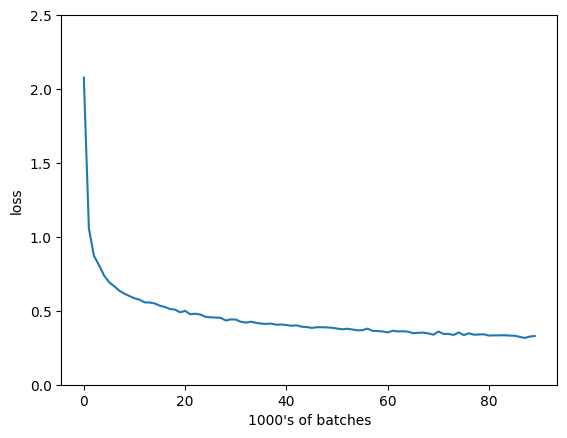

In [59]:
# visualize the loss as the network trained
plt.plot(training_loss)
plt.xlabel('1000\'s of batches')
plt.ylabel('loss')
plt.ylim(0, 2.5) # consistent scale
plt.show()

In [60]:
# initialize tensor and lists to monitor test loss and accuracy
test_loss = torch.zeros(1)
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))

# set the module to evaluation mode
net.eval()

for batch_i, data in enumerate(test_loader):
    
    # get the input images and their corresponding labels
    inputs, labels = data
    
    # forward pass to get outputs
    outputs = net(inputs)

    # calculate the loss
    loss = criterion(outputs, labels)
            
    # update average test loss 
    test_loss = test_loss + ((torch.ones(1) / (batch_i + 1)) * (loss.data - test_loss))
    
    # get the predicted class from the maximum value in the output-list of class scores
    _, predicted = torch.max(outputs.data, 1)
    
    # compare predictions to true label
    # this creates a `correct` Tensor that holds the number of correctly classified images in a batch
    correct = np.squeeze(predicted.eq(labels.data.view_as(predicted)))
    
    # calculate test accuracy for *each* object class
    # we get the scalar value of correct items for a class, by calling `correct[i].item()`
    for i in range(batch_size):
        label = labels.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

print('Test Loss: {:.6f}\n'.format(test_loss.numpy()[0]))

for i in range(10):
    if class_total[i] > 0:
        print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
            classes[i], 100 * class_correct[i] / class_total[i],
            np.sum(class_correct[i]), np.sum(class_total[i])))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

        
print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))

Test Loss: 0.320266

Test Accuracy of T-shirt/top: 84% (849/1000)
Test Accuracy of Trouser: 97% (972/1000)
Test Accuracy of Pullover: 76% (762/1000)
Test Accuracy of Dress: 90% (909/1000)
Test Accuracy of  Coat: 90% (903/1000)
Test Accuracy of Sandal: 96% (967/1000)
Test Accuracy of Shirt: 61% (619/1000)
Test Accuracy of Sneaker: 95% (957/1000)
Test Accuracy of   Bag: 97% (978/1000)
Test Accuracy of Ankle boot: 95% (959/1000)

Test Accuracy (Overall): 88% (8875/10000)


In [61]:
# Saving the model
model_dir = 'img/'
model_name = 'fashion_net_ex.pt'

# after training, save your model parameters in the dir 'saved_models'
# when you're ready, un-comment the line below
torch.save(net.state_dict(), model_dir+model_name)

# Network Structure

## How can you decide on a network structure?

At this point, deciding on a network structure: how many layers to create, when to include dropout layers, and so on, may seem a bit like guessing, but there is a rationale behind defining a good model.

I think a lot of people (myself included) build up an intuition about how to structure a network from existing models. Take AlexNet as an example; linked is a nice, concise walkthrough of structure and reasoning(https://medium.com/@smallfishbigsea/a-walk-through-of-alexnet-6cbd137a5637)

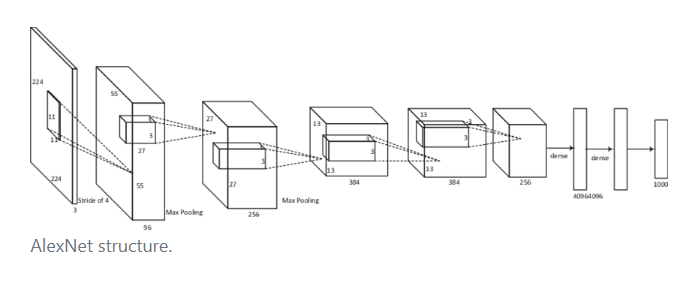

### Preventing Overfitting

Often we see batch norm applied after early layers in the network, say after a set of conv/pool/activation steps since this normalization step is fairly quick and reduces the amount by which hidden weight values shift around. Dropout layers often come near the end of the network; placing them in between fully-connected layers for example can prevent any node in those layers from overly-dominating.

### Convolutional and Pooling Layers

As far as conv/pool structure, I would again recommend looking at existing architectures, since many people have already done the work of throwing things together and seeing what works. In general, more layers = you can see more complex structures, but you should always consider the size and complexity of your training data (many layers may not be necessary for a simple task).

When you are first learning about CNN's for classification or any other task, you can improve your intuition about model design by approaching a simple task (such as clothing classification) and quickly trying out new approaches. You are encouraged to:

* Change the number of convolutional layers and see what happens
* Increase the size of convolutional kernels for larger images
* Change loss/optimization functions to see how your model responds (especially change your hyperparameters such as learning rate and see what happens -- you will learn more about hyperparameters in the second module of this course)
* Add layers to prevent overfitting
* Change the batch_size of your data loader to see how larger batch sizes can affect your training

Always watch how much and how quickly your model loss decreases, and learn from improvements as well as mistakes!

### Feature Visualization

Sometimes, neural networks are thought of as a black box, given some input, they learn to produce some output. CNN's are actually learning to recognize a variety of spatial patterns and you can visualize what each convolutional layer has been trained to recognize by looking at the weights that make up each convolutional kernel and applying those one at a time to a sample image. These techniques are called feature visualization and they are useful for understanding the inner workings of a CNN.

In the cell below, you'll see how to extract and visualize the filter weights for all of the filters in the first convolutional layer.

Note the patterns of light and dark pixels and see if you can tell what a particular filter is detecting. For example, the filter pictured in the example below has dark pixels on either side and light pixels in the middle column, and so it may be detecting vertical edges.

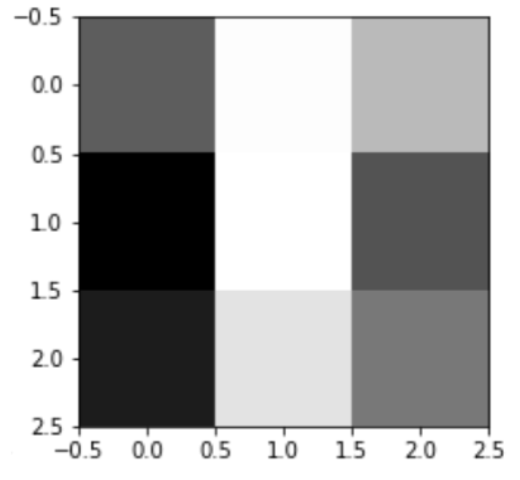

First convolutional layer


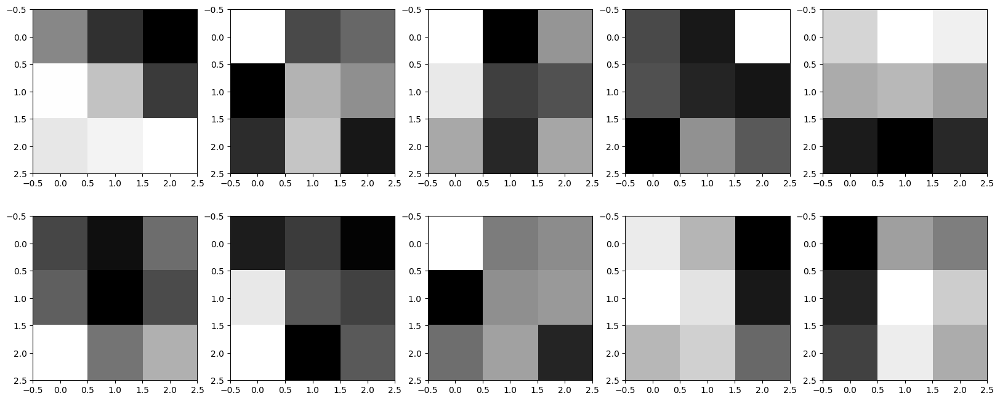

In [62]:
# Get the weights in the first conv layer
weights = net.conv1.weight.data
w = weights.numpy()

# for 10 filters
fig=plt.figure(figsize=(20, 8))
columns = 5
rows = 2
for i in range(0, columns*rows):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(w[i][0], cmap='gray')
    
print('First convolutional layer')
plt.show()

weights = net.conv2.weight.data
w = weights.numpy()

In [66]:
len(w)

20

### Activation Maps

Next, you'll see how to use OpenCV's filter2D function to apply these filters to a sample test image and produce a series of activation maps as a result. We'll do this for the first and second convolutional layers and these activation maps whould really give you a sense for what features each filter learns to extract.

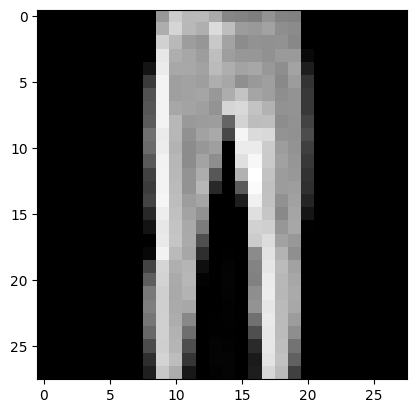

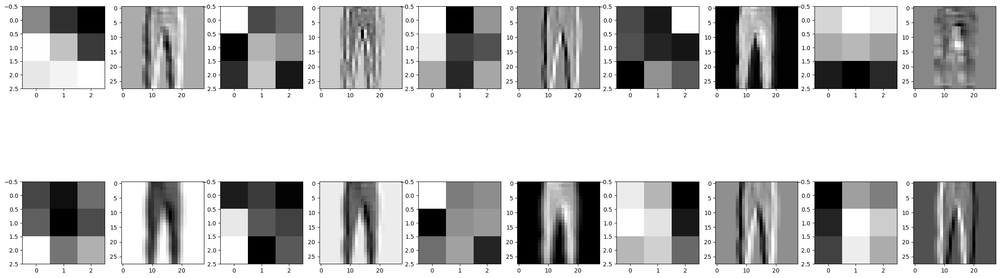

In [69]:
# obtain one batch of testing images
dataiter = iter(test_loader)
images, labels = dataiter.__next__()
images = images.numpy()

# select an image by index
idx = 10
img = np.squeeze(images[idx])

# Use OpenCV's filter2D function 
# apply a specific set of filter weights (like the one's displayed above) to the test image

import cv2
plt.imshow(img, cmap='gray')

weights = net.conv1.weight.data
w = weights.numpy()

# 1. first conv layer
# for 10 filters
fig=plt.figure(figsize=(30, 10))
columns = 5*2
rows = 2
for i in range(0, columns*rows):
    fig.add_subplot(rows, columns, i+1)
    if ((i%2)==0):
        plt.imshow(w[int(i/2)][0], cmap='gray')
    else:
        c = cv2.filter2D(img, -1, w[int((i-1)/2)][0])
        plt.imshow(c, cmap='gray')
plt.show()

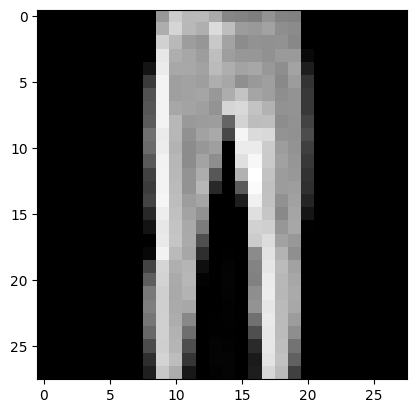

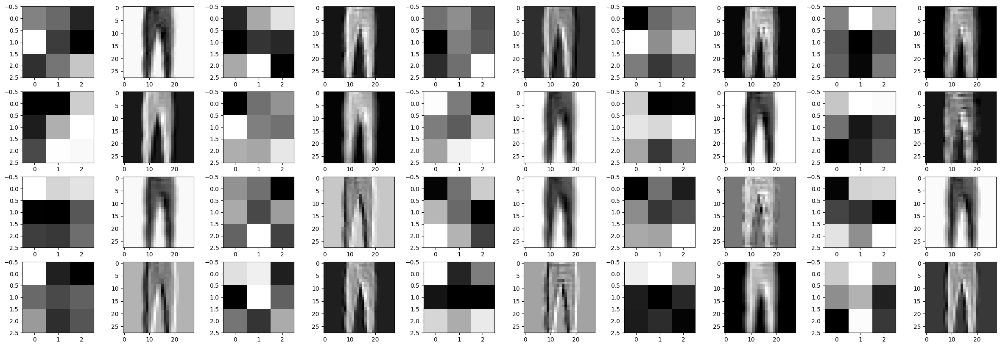

In [70]:
# Same process but for the second conv layer (20, 3x3 filters):
plt.imshow(img, cmap='gray')

# second conv layer, conv2
weights = net.conv2.weight.data
w = weights.numpy()

# 1. first conv layer
# for 20 filters
fig=plt.figure(figsize=(30, 10))
columns = 5*2
rows = 2*2
for i in range(0, columns*rows):
    fig.add_subplot(rows, columns, i+1)
    if ((i%2)==0):
        plt.imshow(w[int(i/2)][0], cmap='gray')
    else:
        c = cv2.filter2D(img, -1, w[int((i-1)/2)][0])
        plt.imshow(c, cmap='gray')
plt.show()

# Last Feature Vector and t-SNE

## Last Layer

In addition to looking at the first layer(s) of a CNN, we can take the opposite approach, and look at the last linear layer in a model.

We know that the output of a classification CNN, is a fully-connected class score layer, and one layer before that is a **feature vector that represents the content of the input image in some way**. This feature vector is produced after an input image has gone through all the layers in the CNN, and it contains enough distinguishing information to classify the image.

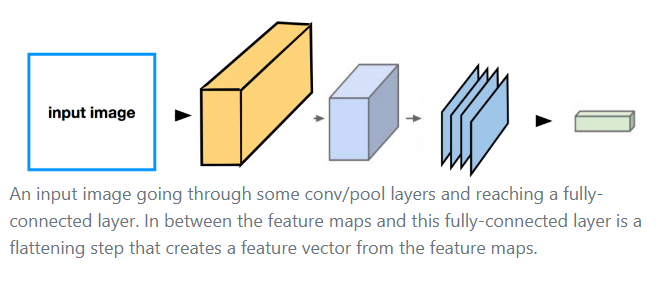

### Final Feature Vector

So, how can we understand what’s going on in this final feature vector? What kind of information has it distilled from an image?

To visualize what a vector represents about an image, we can compare it to other feature vectors, produced by the same CNN as it sees different input images. We can run a bunch of different images through a CNN and record the last feature vector for each image. This creates a feature space, where we can compare how similar these vectors are to one another.

We can measure vector-closeness by looking at the **nearest neighbors** in feature space. Nearest neighbors for an image is just an image that is near to it; that matches its pixels values as closely as possible. So, an image of an orange basketball will closely match other orange basketballs or even other orange, round shapes like an orange fruit, as seen below.

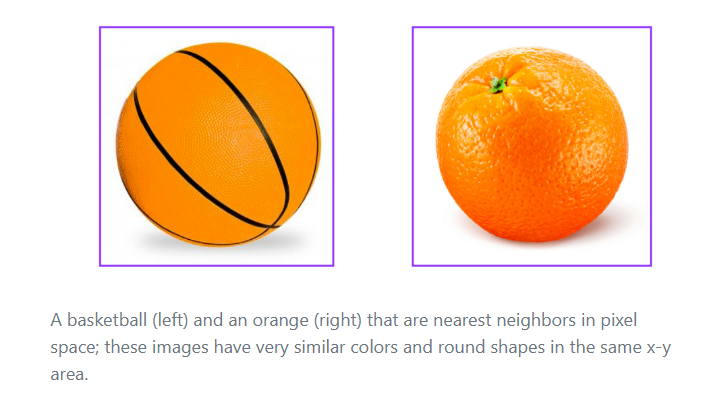

### Nearest neighbors in feature space

In feature space, the nearest neighbors for a given feature vector are the vectors that most closely match that one; we typically compare these with a metric like MSE or L1 distance. And these images may or may not have similar pixels, which the nearest-neighbor pixel images do; instead they have very similar content, which the feature vector has distilled.

In short, to visualize the last layer in a CNN, we ask: which feature vectors are closest to one another and which images do those correspond to?

And you can see an example of nearest neighbors in feature space, below; an image of a basketball that matches with other images of basketballs despite being a different color.

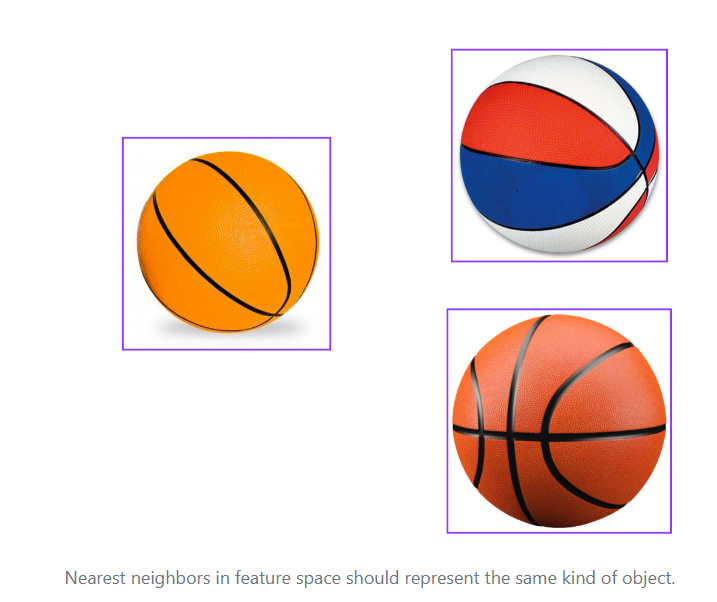

## Dimensionality reduction

Another method for visualizing this last layer in a CNN is to reduce the dimensionality of the final feature vector so that we can display it in 2D or 3D space.

For example, say we have a CNN that produces a 256-dimension vector (a list of 256 values). In this case, our task would be to reduce this 256-dimension vector into 2 dimensions that can then be plotted on an x-y axis. There are a few techniques that have been developed for compressing data like this.

### Principal Component Analysis

One is PCA, principal component analysis, which takes a high dimensional vector and compresses it down to two dimensions. It does this by looking at the feature space and creating two variables (x, y) that are functions of these features; these two variables want to be as different as possible, which means that the produced x and y end up separating the original feature data distribution by as large a margin as possible.

### t-SNE

Another really powerful method for visualization is called t-SNE (pronounced, tea-SNEE), which stands for t-distributed stochastic neighbor embeddings. It’s a non-linear dimensionality reduction that, again, aims to separate data in a way that clusters similar data close together and separates differing data.

As an example, below is a t-SNE reduction done on the MNIST dataset, which is a dataset of thousands of 28x28 images, similar to FashionMNIST, where each image is one of 10 hand-written digits 0-9.

The 28x28 pixel space of each digit is compressed to 2 dimensions by t-SNE and you can see that this produces ten clusters, one for each type of digits in the dataset!

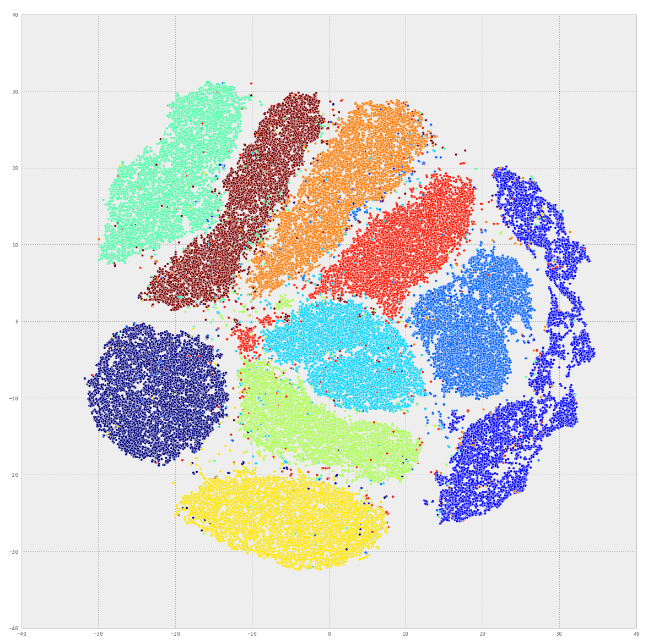

# Occlusion, Saliency, and Guided Backpropagation

## Other Feature Visualization Techniques

Feature visualization is an active area of research and before we move on, I'd like like to give you an overview of some of the techniques that you might see in research or try to implement on your own!

## Occlusion Experiments

Occlusion means to block out or mask part of an image or object. For example, if you are looking at a person but their face is behind a book; this person's face is hidden (occluded). Occlusion can be used in feature visualization by blocking out selective parts of an image and seeing how a network responds.

The process for an occlusion experiment is as follows:

* Mask part of an image before feeding it into a trained CNN,
* Draw a heatmap of class scores for each masked image,
* Slide the masked area to a different spot and repeat steps 1 and 2.

The result should be a heatmap that shows the predicted class of an image as a function of which part of an image was occluded. The reasoning is that **if the class score for a partially occluded image is different than the true class, then the occluded area was likely very important!**

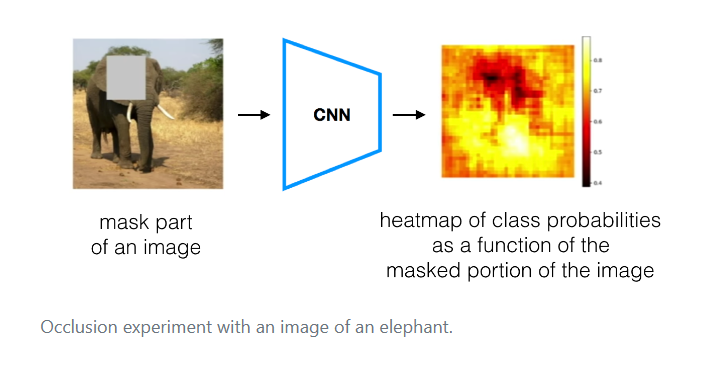

## Saliency Maps

Salience can be thought of as the importance of something, and for a given image, a saliency map asks: Which pixels are most important in classifying this image?

Not all pixels in an image are needed or relevant for classification. In the image of the elephant above, you don't need all the information in the image about the background and you may not even need all the detail about an elephant's skin texture; only the pixels that distinguish the elephant from any other animal are important.

Saliency maps aim to show these important pictures by computing the gradient of the class score with respect to the image pixels. A gradient is a measure of change, and so, the gradient of the class score with respect to the image pixels is a measure of how much a class score for an image changes if a pixel changes a little bit.

### Measuring change

A saliency map tells us, for each pixel in an input image, if we change it's value slightly (by dp), how the class output will change. If the class scores change a lot, then the pixel that experienced a change, dp, is important in the classification task.

Looking at the saliency map below, you can see that it identifies the most important pixels in classifying an image of a flower. These kinds of maps have even been used to perform image segmentation (imagine the map overlay acting as an image mask)!

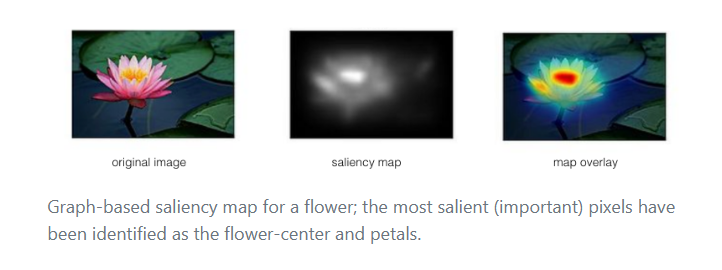

## Guided Backpropagation

Similar to the process for constructing a saliency map, you can compute the gradients for mid level neurons in a network with respect to the input pixels. Guided backpropagation looks at each pixel in an input image, and asks: if we change it's pixel value slightly, how will the output of a particular neuron or layer in the network change. If the expected output change a lot, then the pixel that experienced a change, is important to that particular layer.

This is very similar to the backpropagation steps for measuring the error between an input and output and propagating it back through a network. Guided backpropagation tells us exactly which parts of the image patches, that we’ve looked at, activate a specific neuron/layer.

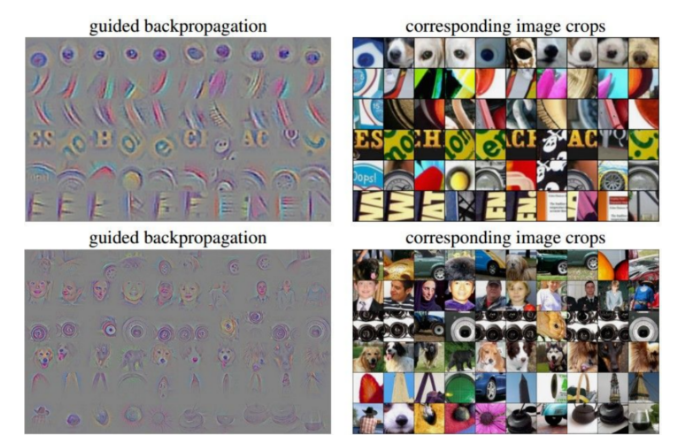

# Deep Dream

DeepDream takes in an input image and uses the features in a trained CNN to amplifying the existing, detected features in the input image! The process is as follows:

* Choose an input image, and choose a convolutional layer in the network whose features you want to amplify (the first layer will amplify simple edges and later layers will amplify more complex features).
* Compute the activation maps for the input image at your chosen layer.
* Set the gradient of the chosen layer equal to the activations and and use this to compute the gradient image.
* Update the input image and repeat!

In step 3, by setting the gradient in the layer equal to the activation, we’re telling that layer to give more weight to the features in the activation map. So, if a layer detects corners, then the corners in an input image will be amplified, and you can see such corners in the upper-right sky of the mountain image, below. For any layer, changing the gradient to be equal to the activations in that layer will amplify the features in the given image that the layer is responding to the most.

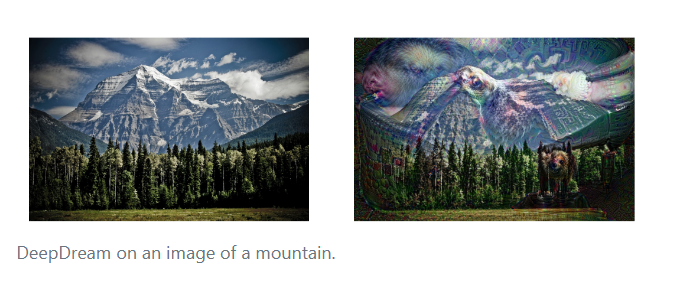

## Style Transfer

Style transfer aims to separate the content of an image from its style. So, how does it do this?

### Isolating content

When Convolutional Neural Networks are trained to recognize objects, further layers in the network extract features that distill information about the content of an image and discard any extraneous information. That is, as we go deeper into a CNN, the input image is transformed into feature maps that increasingly care about the content of the image rather than any detail about the texture and color of pixels (which is something close to style).

You may hear features, in later layers of a network, referred to as a "content representation" of an image.

### Isolating style

To isolate the style of an input image, a feature space designed to capture texture information is used. This space essentially looks at the correlations between feature maps in each layer of a network; the correlations give us an idea of texture and color information but leave out information about the arrangement of different objects in an image.

### Combining style and content to create a new image

Style transfer takes in two images, and separates the content and style of each of those images. Then, to transfer the style of one image to another, it takes the content of the new image and applies the style of an another image (often a famous artwork).

The objects and shape arrangement of the new image is preserved, and the colors and textures (style) that make up the image are taken from another image. Below you can see an example of an image of a cat [content] being combined with the a Hokusai image of waves [style]. Effectively, style transfer renders the cat image in the style of the wave artwork.

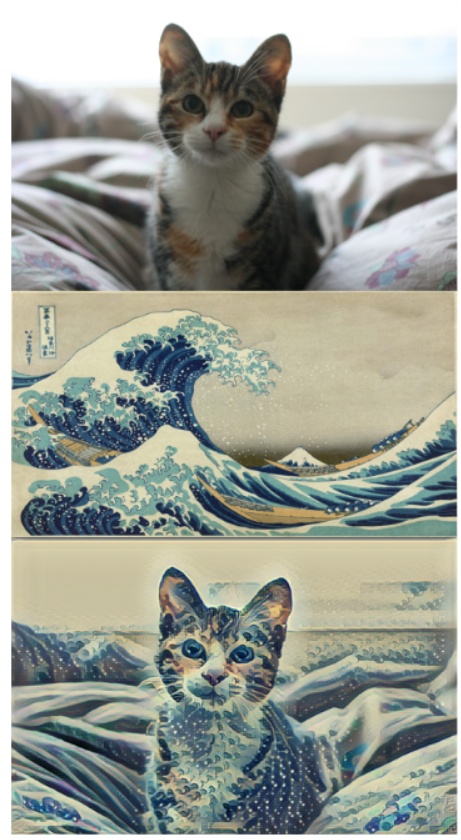